In [ ]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from matplotlib import pyplot as plt

from scipy.stats import zscore, pearsonr
from statsmodels.stats.multitest import fdrcorrection
from scipy.stats import wilcoxon
from scipy.stats import mannwhitneyu

In [ ]:
%cd /home/orimosko/projects/phago/downloaded/

/home/orimosko/projects/phago/downloaded


In [ ]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')  # low dpi (dots per inch) yields small inline figures

scanpy==1.9.8 anndata==0.9.2 umap==0.5.6 numpy==1.23.5 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.2 statsmodels==0.14.1 igraph==0.10.1 pynndescent==0.5.4


/home/orimosko/.local/lib/python3.8/site-packages/pynndescent/utils.py:202: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit(
/home/orimosko/.local/lib/python3.8/site-packages/pynndescent/utils.py:302: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit(


In [ ]:
sns.set_context("paper", font_scale=1.0, rc={'font.size': 7, 'pdf.fonttype': 42})

In [ ]:
plt.rcParams['pdf.fonttype'] = 42

In [ ]:
plt.rcParams.update({'font.size': 7})

In [ ]:
red_colors = ['#fdad83', '#ff5a5a']

In [ ]:
new_up_and_corr_genes = ['Fth1',
 'Wfdc17',
 'Ccl9',
 'Fabp5',
 'Cstb',
 'Marco',
 'Ctsk',
 'Cd63',
 'Lgals3',
 'Lyz2',
 'Esd',
 'Ftl1',
 'Cd68',
 'Rnh1',
 'Ear6',
 'Gpnmb',
 'Mt1',
 'Capg',
 'Tuba1c',
 'Crip1',
 'Acp5',
 'Lgals1',
 'Sod2',
 'Calm1',
 'Calr',
 'Tmsb10',
 'Gapdh',
 'Nme1',
 'Slc39a2',
 'Mrpl52',
 'Emp3',
 'Clec4d',
 'Anxa4',
 'Ctsb',
 'Tyms',
 'Ctsz',
 'Anpep',
 'Tceal9',
 'Msr1',
 'Manf',
 'Ccl17',
 'Cyba',
 'Atp5k',
 'Glrx',
 'Cd24a',
 'Atp6v1c1',
 'Tspo',
 'Calm3',
 'Prdx1',
 'Atp5mpl',
 'Ctsc',
 'Anxa5',
 'Mt2',
 'Bcap31',
 'Hint1',
 'Vat1',
 'Eno1b',
 'Pycard',
 'Aldoa',
 'Cav1',
 'Gla',
 'Fabp4',
 'Nqo2',
 'Atp6v0b',
 'Mfge8',
 'Timm13']

In [ ]:
new_up_and_corr_genes_human = [
    "FTH1", "WFDC17", "CCL9", "FABP5", "CSTB", "MARCO", "CTSK", "CD63", "LGALS3",
    "LYZ", "ESD", "FTL", "CD68", "RNH1", "GPNMB", "MT1A", "CAPG", "TUBA1C",
    "CRIP1", "ACP5", "LGALS1", "SOD2", "CALM1", "CALR", "TMSB10", "GAPDH", "NME1",
    "SLC39A2", "MRPL52", "EMP3", "CLEC4D", "ANXA4", "CTSB", "TYMS", "CTSZ", "ANPEP",
    "TCEAL9", "MSR1", "MANF", "CCL17", "CYBA", "ATP5ME", "GLRX", "CD24", "ATP6V1C1",
    "TSPO", "CALM3", "PRDX1", "ATP5MJ", "CTSC", "ANXA5", "MT2A", "BCAP31", "HINT1",
    "VAT1", "ENO1", "PYCARD", "ALDOA", "CAV1", "GLA", "FABP4", "NQO2", "ATP6V0B",
    "MFGE8", "TIMM13"
]

# Mouse - AD

In [ ]:
adata = sc.read_h5ad('/mc_disk2/data/h5ads/phago/AD_mouse.h5ad')

In [ ]:
sc.pp.filter_cells(adata, min_counts=500)
sc.pp.filter_cells(adata, max_counts=10000)

filtered out 4242 cells that have less than 500 counts


In [ ]:
sc.pp.filter_genes(adata, min_counts=10)

filtered out 8883 genes that are detected in less than 10 counts


In [ ]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [ ]:
sc.pp.log1p(adata)

In [ ]:
sc.pp.highly_variable_genes(adata, min_disp=1)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [ ]:
sc.tl.pca(adata, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


In [ ]:
sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [ ]:
sc.tl.leiden(adata, resolution=0.75)

running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:04)


In [ ]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


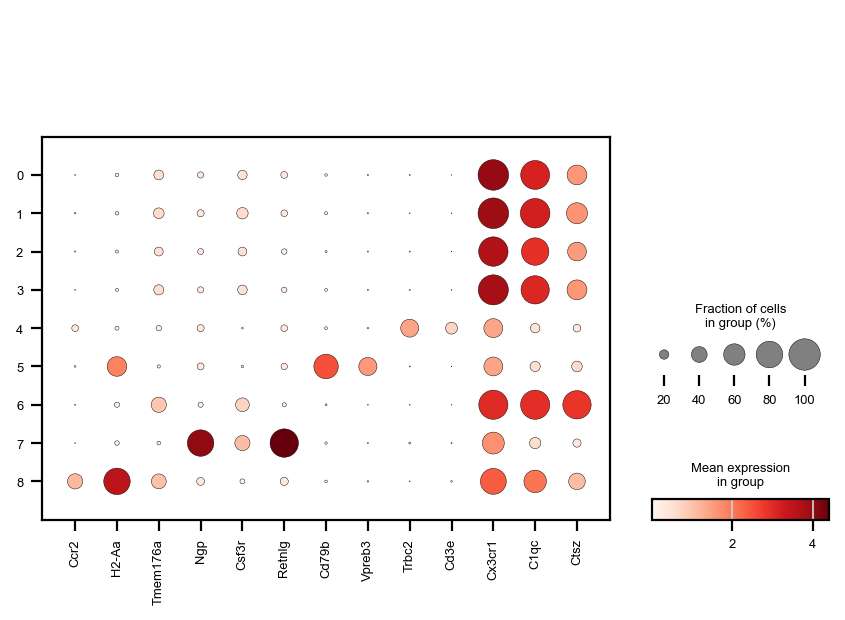

In [ ]:
sc.pl.dotplot(
    adata,
    ['Ccr2', 'H2-Aa', 'Tmem176a', 
     'Ngp', 'Csf3r', 'Retnlg', 
     'Cd79b', 'Vpreb3', 
     'Trbc2', 'Cd3e', 
     'Cx3cr1', 'C1qc', 'Ctsz'], 
    groupby='leiden',
)


In [ ]:
annot_list = ['Microglia', 'Microglia', 'Microglia', 'Microglia', 'T cells', 'B cells', 'Microglia', 'Neutrophils', 
              'MoDCs']
adata.obs['annot'] = pd.Categorical([annot_list[int(i)] for i in adata.obs.leiden],
                                    categories=['T cells', 'B cells', 'MoDCs', 'Neutrophils', 'Microglia'])

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


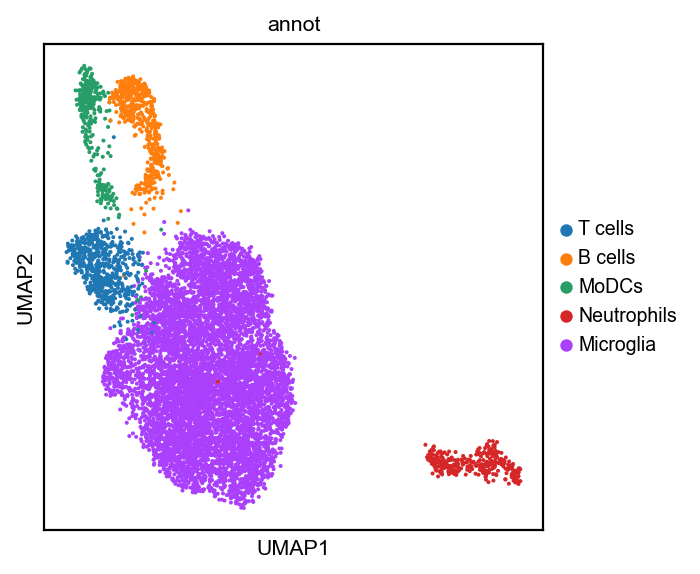

In [ ]:
sc.pl.umap(adata, color='annot', save='_AD.pdf')

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


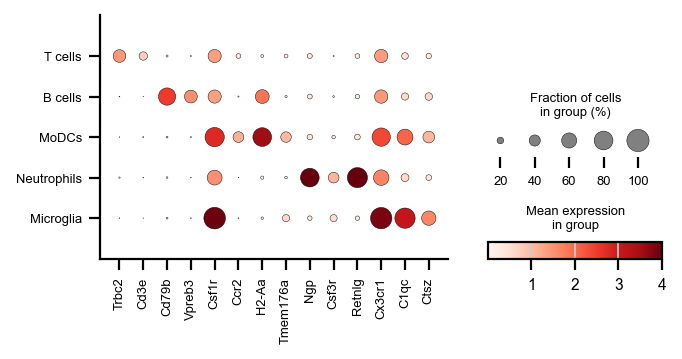

In [ ]:
dot = sc.pl.dotplot(
    adata,
    ['Trbc2', 'Cd3e', 
     'Cd79b', 'Vpreb3', 
     'Csf1r', 'Ccr2', 'H2-Aa', 'Tmem176a', 
     'Ngp', 'Csf3r', 'Retnlg', 
     'Cx3cr1', 'C1qc', 'Ctsz'], 
    groupby='annot',
    figsize=(4.5, 2),
    vmax=4,
    return_fig=True 
)

fig = dot.get_axes()['mainplot_ax'].get_figure()

# Hide top and right spines for all axes
for ax in fig.axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
# Shrink main dots
for artist in dot.get_axes()['mainplot_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)

# Shrink legend dots
for artist in dot.get_axes()['size_legend_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)
    
for label in ax.get_xticklabels():
    label.set_fontsize(7)
for label in ax.get_yticklabels():
    label.set_fontsize(7)

fig.savefig('AD_figures/dotplotmouse_ad.pdf')

In [ ]:
microglia = adata[~adata.obs.leiden.isin(['7', '4', '5', '8'])]

In [ ]:
sc.pp.highly_variable_genes(microglia, min_disp=1)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:553: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


In [ ]:
sc.tl.pca(microglia, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


In [ ]:
sc.pp.neighbors(microglia)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [ ]:
sc.tl.leiden(microglia, resolution=0.5)

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:03)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


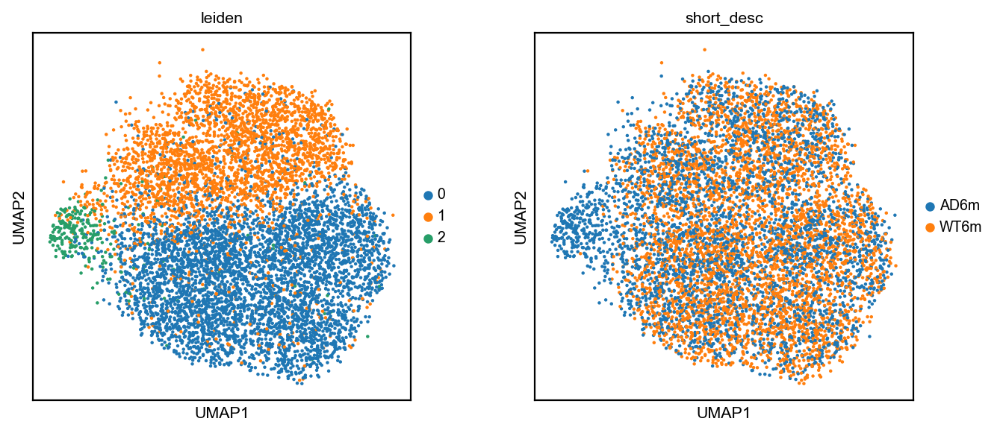

In [ ]:
sc.pl.umap(microglia, color=['leiden', 'short_desc'], ncols=2)

In [ ]:
microglia.obs['annot'] = pd.Categorical(['DAM' if l == '2' else 'microglia' for l in microglia.obs.leiden], 
                                        categories=['microglia', 'DAM'])

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


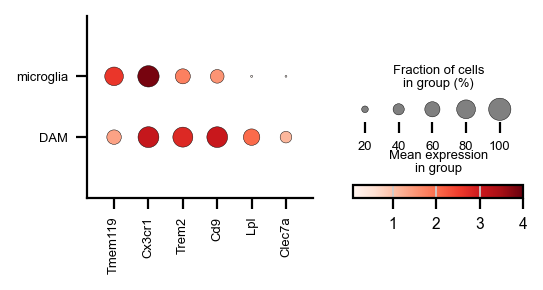

In [ ]:
dot = sc.pl.dotplot(microglia, ['Tmem119', 'Cx3cr1', 'Trem2', 'Cd9', 'Lpl', 'Clec7a'], 
              groupby='annot', figsize=(3.5,1.5), vmax=4, return_fig=True)
                    
fig = dot.get_axes()['mainplot_ax'].get_figure()

# Hide top and right spines for all axes
for ax in fig.axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
# Shrink main dots
for artist in dot.get_axes()['mainplot_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)

# Shrink legend dots
for artist in dot.get_axes()['size_legend_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)
    
for label in ax.get_xticklabels():
    label.set_fontsize(7)
for label in ax.get_yticklabels():
    label.set_fontsize(7)

fig.savefig('AD_figures/mouse_ad_DAM_annot.pdf')  

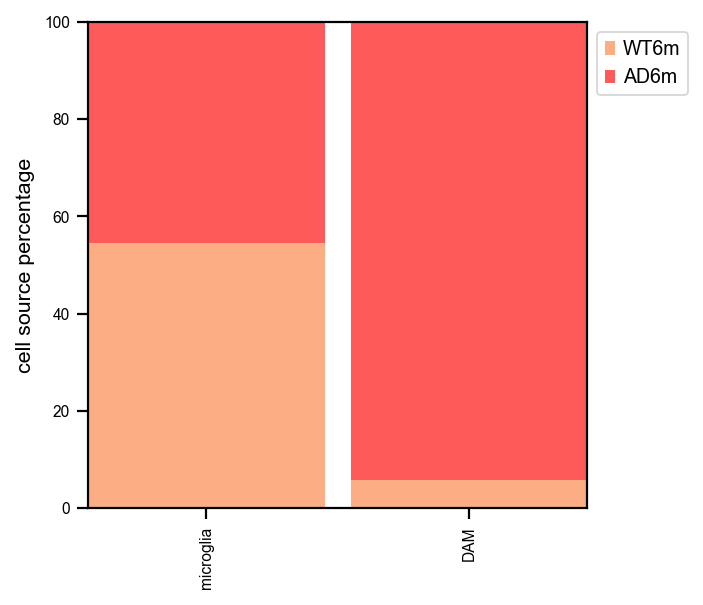

In [ ]:
df = pd.DataFrame(index=microglia.obs.annot.values.categories,
                  data=[microglia[microglia.obs.annot.values == i, :].obs.short_desc.value_counts() 
                        for i in microglia.obs.annot.values.categories])
for i in df.index:
    df.loc[i] = 100 * df.loc[i] / np.nansum(df.loc[i])
ax = df.plot(kind="bar", color=red_colors, stacked=True, ylabel="cluster", width=0.9, fontsize=7)
ax.set_ylabel("cell source percentage")
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.grid(False)
ax.set_ylim((0,100))
ax.set_xlim((-0.45, len(df)-0.55))

#for col in df.columns[:-1]:
#    ax.vlines(100 * sum(microglia.obs.short_desc == col) / len(microglia.obs), 
#              ymin=-0.45, ymax=len(df)-0.55, colors="black")
plt.savefig('AD_figures/mouse_dam_composition.pdf')

In [ ]:
sc.tl.score_genes(microglia, new_up_and_corr_genes, score_name='effero_score', use_raw=False)

computing score 'effero_score'
    finished: added
    'effero_score', score of gene set (adata.obs).
    947 total control genes are used. (0:00:00)


In [ ]:
mobs = microglia.obs

In [ ]:
mannwhitneyu(mobs[mobs.short_desc == "WT6m"].effero_score, mobs[mobs.short_desc == "AD6m"].effero_score)

MannwhitneyuResult(statistic=5586371.0, pvalue=2.5401388299019546e-46)

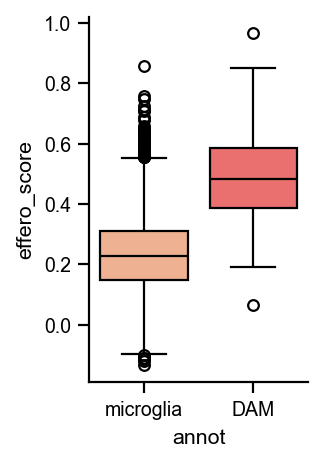

In [ ]:
fig, ax = plt.subplots(figsize=(1.75,3))
sns.boxplot(microglia.obs, x='annot', y='effero_score', hue='annot', palette=red_colors, 
            boxprops=dict(edgecolor='black'), medianprops=dict(color='black'), whiskerprops=dict(color='black'), 
            capprops=dict(color='black'), flierprops=dict(markeredgecolor='black'))
plt.grid(False)
sns.despine(top=True, right=True)
plt.savefig('AD_figures/mouse_dam_scores.pdf')

# Human - ALS

In [ ]:
adata = sc.read_h5ad('/mc_disk2/data/h5ads/phago/ALS_human.h5ad')

In [ ]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

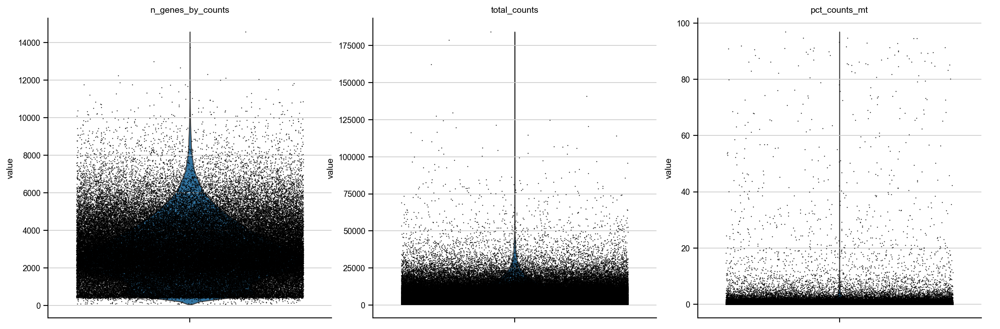

In [ ]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

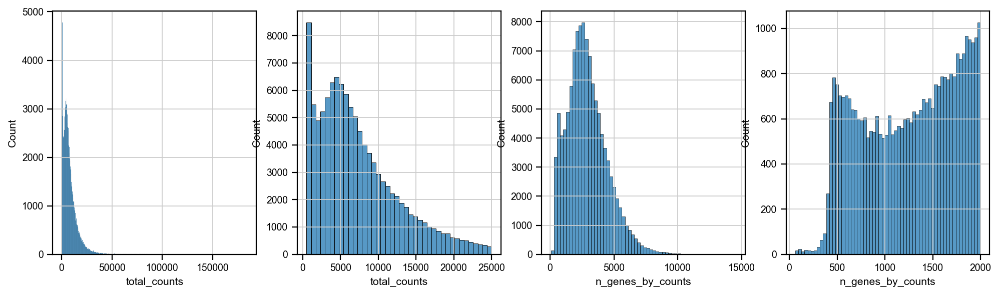

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 25000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 2000],
    kde=False,
    bins=60,
    ax=axs[3],
)


In [ ]:
adata.shape

(114161, 36601)

In [ ]:
sc.pp.filter_cells(adata, min_counts=500)
sc.pp.filter_cells(adata, max_counts=20000)

filtered out 7330 cells that have more than 20000 counts


In [ ]:
adata.shape

(106831, 36601)

In [ ]:
adata = adata[adata.obs.pct_counts_mt < 10]

In [ ]:
adata.shape

(105841, 36601)

In [ ]:
sc.pp.filter_genes(adata, min_counts=10)

filtered out 4359 genes that are detected in less than 10 counts


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:248: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_counts'] = number


In [ ]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [ ]:
sc.pp.log1p(adata)

In [ ]:
sc.pp.highly_variable_genes(adata)

extracting highly variable genes
    finished (0:00:05)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


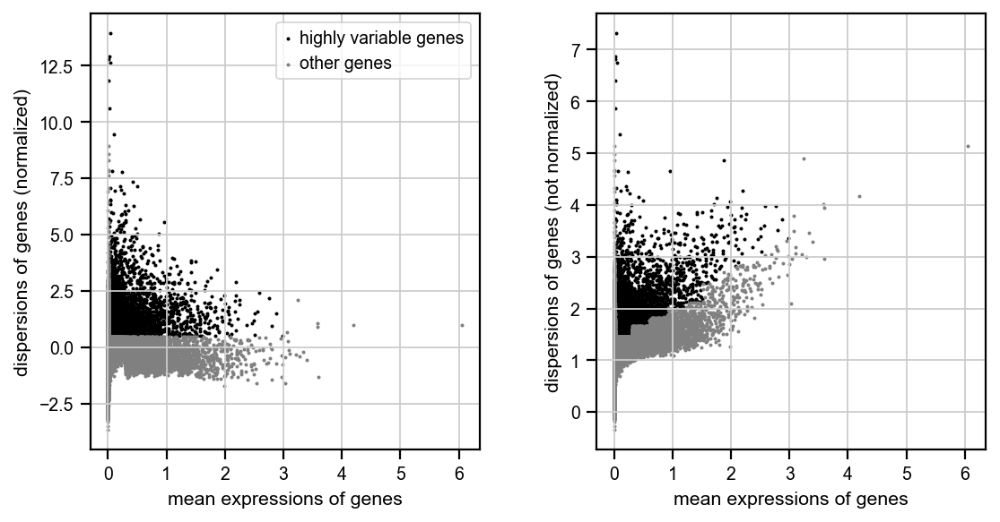

In [ ]:
sc.pl.highly_variable_genes(adata)

In [ ]:
sc.pp.pca(adata, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:17)


In [ ]:
sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)


In [ ]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:58)


In [ ]:
sc.tl.leiden(adata, resolution=0.05)

running Leiden clustering


    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:44)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


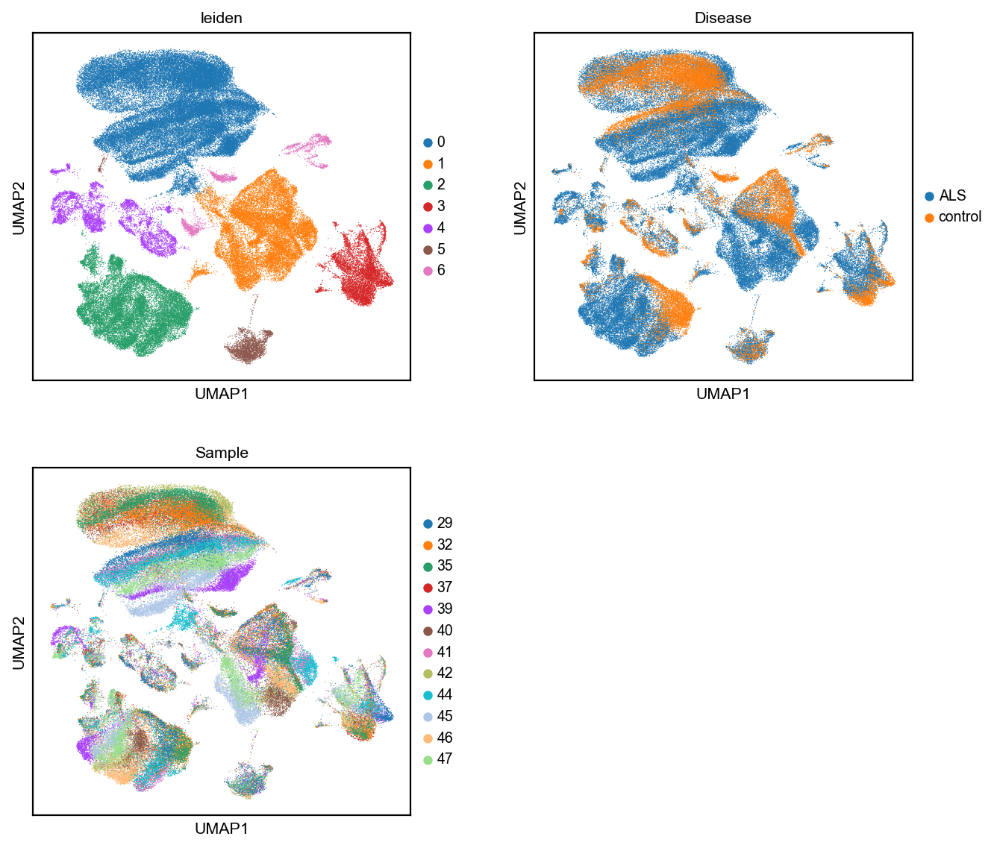

In [ ]:
sc.pl.umap(adata, color=['leiden', 'Disease', 'Sample'], ncols=2)

In [ ]:
sc.tl.rank_genes_groups(adata, groupby="leiden")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:14)


In [ ]:
pd.DataFrame(adata.uns["rank_genes_groups"]["names"][0:25])

,0,1,2,3,4,5,6
0,ST18,NRG3,ARHGAP24,TNR,RBMS3,PTPRC,SNHG14
1,RNF220,ADCY2,PLXDC2,OPCML,ARHGAP29,PARP8,SCN1A
2,SLC24A2,SORBS1,LRMDA,LHFPL3,EBF1,SKAP1,MT-CYB
3,EDIL3,ABLIM1,FRMD4A,PTPRZ1,UACA,PRKCH,MT-CO3
4,SLC44A1,DPP10,DOCK8,CSMD1,PTPRG,MBNL1,MT-CO2
5,MBP,CTNND2,CHST11,DSCAM,UTRN,THEMIS,MAP2
6,PLEKHH1,OBI1-AS1,MEF2A,KCNIP4,SYNE2,MALAT1,MT-ATP6
7,MOBP,DTNA,MEF2C,PCDH15,PLCB4,STAT4,SNAP25
8,PEX5L,AC012405.1,ADAM28,NRCAM,VIM,CBLB,SYT1
9,NKAIN2,PITPNC1,ARHGAP15,VCAN,LHFPL6,SLFN12L,CALM1


In [ ]:
sc.tl.dendrogram(adata, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


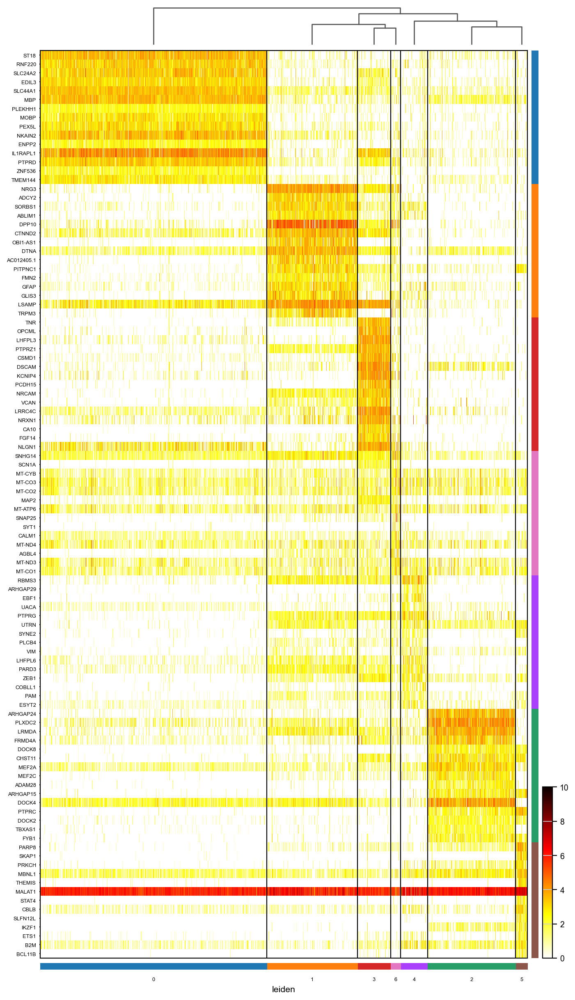

In [ ]:
gene_dict = {str(i): [l[i] for l in adata.uns["rank_genes_groups"]["names"][:15]] 
             for i in adata.obs.leiden.values.categories}

prev_vals = []
for k in gene_dict.keys():
    gene_dict[k] = [i for i in gene_dict[k] if i not in prev_vals]
    prev_vals += gene_dict[k]

sc.pl.heatmap(adata, gene_dict, groupby="leiden", dendrogram=True, swap_axes=True, 
              cmap="hot_r", vmin=0, vmax=10, show_gene_labels=True)

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


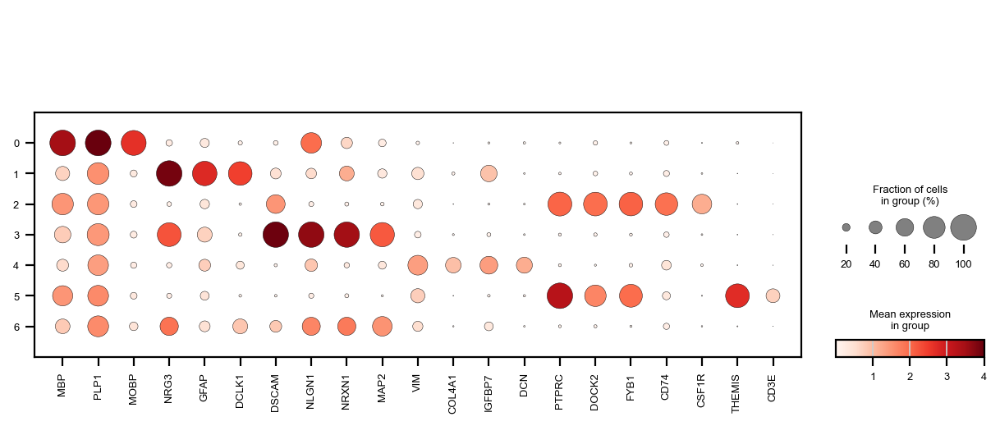

In [ ]:
sc.pl.dotplot(adata, ['MBP', 'PLP1', 'MOBP',
                      'NRG3', 'GFAP', 'DCLK1',
                      'DSCAM', 'NLGN1', 'NRXN1', 'MAP2',
                      'VIM', 'COL4A1', 'IGFBP7', 'DCN',
                      'PTPRC', 'DOCK2', 'FYB1', 'CD74', 'CSF1R', 'THEMIS', 'CD3E'], groupby='leiden', vmax=4,)

In [ ]:
annot_list = ['Oligodendrocytes', 'Astrocytes', 'Microglia', 'Neurons', 'Mesenchymal', 'T cells', 'Neurons']
adata.obs['annot'] = pd.Categorical([annot_list[int(i)] for i in adata.obs.leiden],
                                    categories=['Neurons', 'Oligodendrocytes', 'Astrocytes', 'Mesenchymal', 
                                                'T cells', 'Microglia'])

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


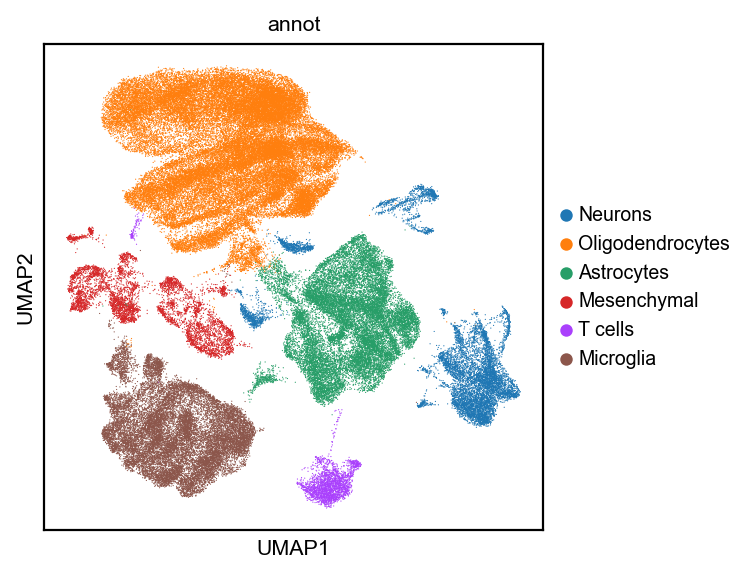

In [ ]:
sc.pl.umap(adata, color='annot', save='_ALS.pdf')

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


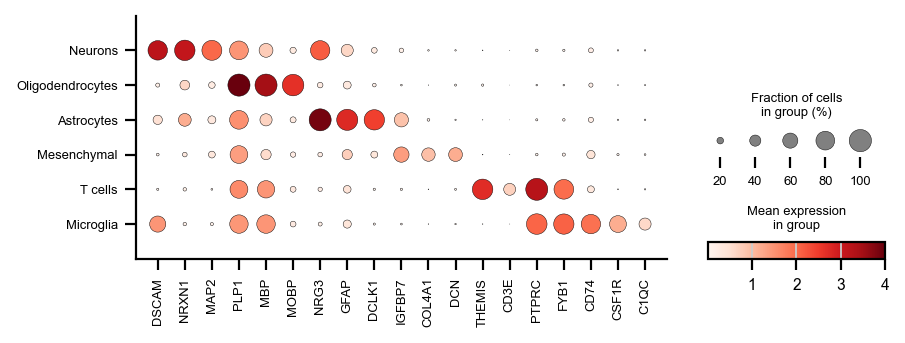

In [ ]:
dot = sc.pl.dotplot(
    adata,
    ['DSCAM', 'NRXN1', 'MAP2', 'PLP1', 'MBP', 'MOBP', 'NRG3', 'GFAP', 'DCLK1', 'IGFBP7', 'COL4A1', 'DCN',
     'THEMIS', 'CD3E', 'PTPRC', 'FYB1', 'CD74', 'CSF1R', 'C1QC'], 
    groupby='annot',
    figsize=(6, 2),
    vmax=4,
    return_fig=True
)

fig = dot.get_axes()['mainplot_ax'].get_figure()

# Hide top and right spines for all axes
for ax in fig.axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
# Shrink main dots
for artist in dot.get_axes()['mainplot_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)

# Shrink legend dots
for artist in dot.get_axes()['size_legend_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)
    
for label in ax.get_xticklabels():
    label.set_fontsize(7)
for label in ax.get_yticklabels():
    label.set_fontsize(7)

fig.savefig('ALS_figs/dotplotmouse_ALS.pdf')

In [499]:
microglia = adata[adata.obs.annot == "Microglia"]

In [500]:
sc.tl.score_genes(microglia, new_up_and_corr_genes_human, score_name='effero_score', use_raw=False)

computing score 'effero_score'


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(


    finished: added
    'effero_score', score of gene set (adata.obs).
    797 total control genes are used. (0:00:01)


/tmp/ipykernel_540536/3731471094.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(


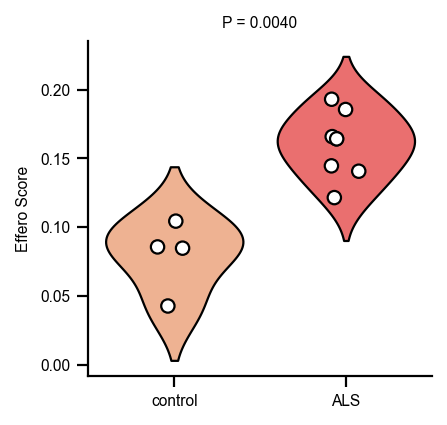

In [501]:
plt.figure(figsize=(2.75, 2.75))

mean_scores = microglia.obs.groupby(["Sample", "Disease"])["effero_score"].mean().reset_index()
mean_scores = mean_scores.dropna()
mean_scores["Disease"] = pd.Categorical(mean_scores["Disease"], categories=["control","ALS"], ordered=True)
palette = ['#ff7f0e', '#1f77b4']

nor_scores = mean_scores.loc[mean_scores["Disease"] == "control", "effero_score"]
ipf_scores = mean_scores.loc[mean_scores["Disease"] == "ALS", "effero_score"]
stat, p_value = mannwhitneyu(nor_scores, ipf_scores, alternative="two-sided")

sns.violinplot(
    data=mean_scores,
    inner=None,
    x="Disease",
    y="effero_score",
    hue="Disease",
    edgecolor="black",
    palette=['#fdad83', '#ff5a5a']
)
sns.stripplot(
    data=mean_scores,
    x="Disease",
    y="effero_score",
    size=6,  # Increase point size
    edgecolor="black",
    palette=["white", "white"],
    linewidth=1,
    legend=False
)
sns.despine(top=True, right=True)
plt.title("P = %.4f" % (p_value), fontsize=7)
plt.xlabel("", fontsize=7)
plt.ylabel("Effero Score", fontsize=7)
plt.xticks(fontsize=7)
plt.yticks(fontsize=7)
plt.grid(False)
plt.savefig('ALS_figs/per_sample_scores.pdf')

plt.show()

In [502]:
sc.pp.filter_genes(microglia, min_cells=50)

filtered out 11848 genes that are detected in less than 50 cells


In [503]:
nor_microglia = microglia[microglia.obs.Disease == "control"]
ALS_microglia = microglia[microglia.obs.Disease == "ALS"]

In [504]:
gene_df = pd.DataFrame(index=microglia.var_names, columns=['pearson_r_normal', 'pearson_p_normal', 'pearson_r_ALS', 'pearson_p_ALS'])

In [507]:
for gene in microglia.var_names:
    r_nor, p_nor = pearsonr(nor_microglia[:, gene].X.todense().A1, nor_microglia.obs['effero_score'])
    r_ALS, p_ALS = pearsonr(ALS_microglia[:, gene].X.todense().A1, ALS_microglia.obs['effero_score'])
    
    gene_df.loc[gene, 'pearson_r_normal'] = r_nor
    gene_df.loc[gene, 'pearson_p_normal'] = p_nor
    gene_df.loc[gene, 'pearson_r_ALS'] = r_ALS
    gene_df.loc[gene, 'pearson_p_ALS'] = p_ALS

/home/orimosko/.local/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


In [508]:
gene_df = gene_df.loc[np.setdiff1d(gene_df.index, new_up_and_corr_genes_human)]

In [518]:
gene_df.to_csv('correlations_ALS_both.csv')

# Mouse fibrosis

In [439]:
adata = sc.read_h5ad("/mc_disk2/data/h5ads/phago/liu_qc.h5ad")

In [440]:
adata = adata[adata.obs.fn14_ko == "wt"]

In [441]:
adata = adata[adata.obs.Timepoint.isin([0,7])]

In [442]:
adata.shape

(14663, 32285)

In [443]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [444]:
sc.pp.log1p(adata)

In [445]:
sc.pp.highly_variable_genes(adata)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [446]:
sc.pp.pca(adata, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


In [447]:
sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [448]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


In [482]:
sc.tl.leiden(adata, resolution=0.15)

running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


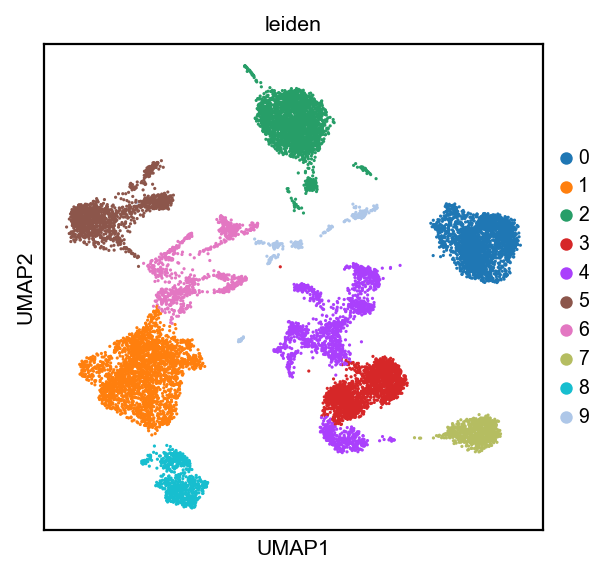

In [483]:
sc.pl.umap(adata, color='leiden')

In [484]:
sc.tl.rank_genes_groups(adata, groupby="leiden")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


In [485]:
pd.DataFrame(adata.uns["rank_genes_groups"]["names"][0:25])

,0,1,2,3,4,5,6,7,8,9
0,Cd79a,Ctss,S100a9,Rpl12,Cd3g,Ifitm3,Ifi30,Ccl5,Chil3,Cavin2
1,Ebf1,C1qb,S100a8,Rps16,Trbc2,Cybb,Cd74,Nkg7,Cd9,Sptbn1
2,Cd74,Ctsz,Hdc,Tpt1,Rora,Lyz2,Cst3,Gzma,Plet1,Nfib
3,Igkc,Psap,Srgn,Rplp1,Cd3d,Psap,H2-Aa,AW112010,Ctsd,Crip2
4,Ighm,Ctsc,S100a11,Rps27,Rpl13a,Fcer1g,Syngr2,Il2rb,Lpl,Sparc
5,H2-Aa,Grn,Il1r2,Rps24,Ets1,Cebpb,H2-Eb1,Irf8,Atp6v0d2,Arhgef12
6,H2-Ab1,Lyz2,Clec4d,Rps15a,Tmsb10,Gpx1,H2-Ab1,Ugcg,Mrc1,Timp3
7,H2-Eb1,Lamp1,Cxcl2,Rps7,Cd3e,Plac8,H2-DMa,Fcer1g,Sirpa,Cav1
8,Mef2c,Ifi30,Csf3r,Rpl5,Rpl19,Tyrobp,Psmb8,Prf1,Plin2,Nedd4
9,Rps27,Ctsh,Tyrobp,Rps3a1,Rpsa,Cst3,Napsa,Vps37b,Lgals3,Aqp1


In [486]:
sc.tl.dendrogram(adata, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


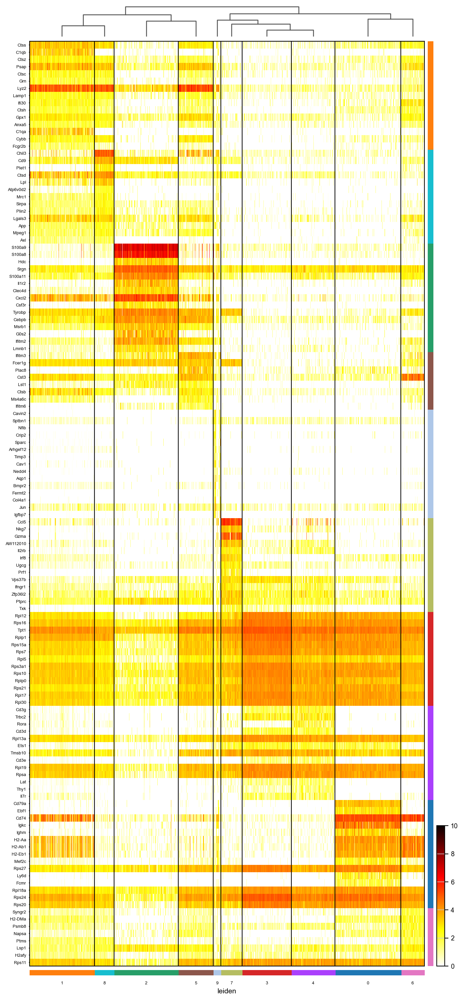

In [487]:
gene_dict = {str(i): [l[i] for l in adata.uns["rank_genes_groups"]["names"][:15]] 
             for i in adata.obs.leiden.values.categories}

prev_vals = []
for k in gene_dict.keys():
    gene_dict[k] = [i for i in gene_dict[k] if i not in prev_vals]
    prev_vals += gene_dict[k]

sc.pl.heatmap(adata, gene_dict, groupby="leiden", dendrogram=True, swap_axes=True, 
              cmap="hot_r", vmin=0, vmax=10, show_gene_labels=True)

In [455]:
# only 14d
#annot_list = ['T cells', 'B cells', 'IntMacs', 'Neutrophils', 'NK cells', 'AlvMacs', 'Endothelial cells', 'Mast cells']
#adata.obs['annot'] = pd.Categorical([annot_list[int(i)] for i in adata.obs.leiden],
#                                    categories=['Endothelial cells', 'B cells', 'T cells', 'NK cells', 'Neutrophils', 
#                                                'Mast cells', 'IntMacs', 'AlvMacs'])

In [534]:
annot_list = ['B cells', 'IntMacs', 'Neutrophils', 'T cells', 'T cells', 'MonMacs', 'DCs', 'NK cells',  'AlvMacs', 'Endothelial cells']
adata.obs['annot'] = pd.Categorical([annot_list[int(i)] for i in adata.obs.leiden],
                                    categories=['Endothelial cells', 'B cells', 'T cells', 'NK cells', 'Neutrophils', 
                                                'DCs', 'MonMacs', 'IntMacs', 'AlvMacs'])

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


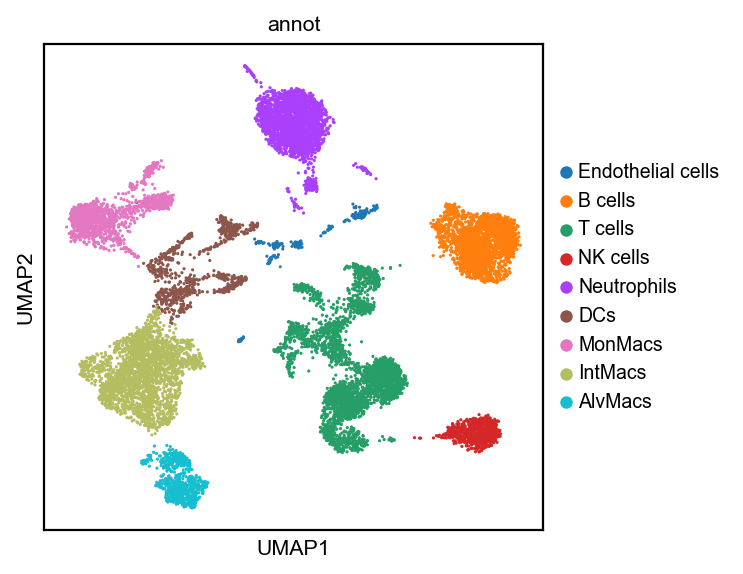

In [535]:
sc.pl.umap(adata, color='annot', save='_mouse_fibrosis.pdf')

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


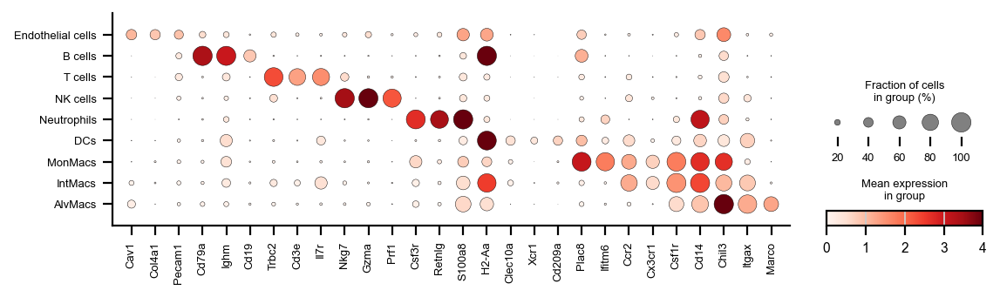

In [536]:
dot = sc.pl.dotplot(
    adata,
    ["Cav1", "Col4a1", "Pecam1",
     "Cd79a", "Ighm", "Cd19",
     "Trbc2", "Cd3e", "Il7r",
     "Nkg7", "Gzma", "Prf1",
     "Csf3r", "Retnlg", "S100a8",
     "H2-Aa", "Clec10a", "Xcr1", "Cd209a",
     "Plac8", "Ifitm6", "Ccr2", 
     "Cx3cr1", "Csf1r", "Cd14", 
     "Chil3", "Itgax", "Marco"], 
    groupby='annot',
    figsize=(8, 2),
    vmax=4,
    return_fig=True
)

fig = dot.get_axes()['mainplot_ax'].get_figure()

# Hide top and right spines for all axes
for ax in fig.axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
# Shrink main dots
for artist in dot.get_axes()['mainplot_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)

# Shrink legend dots
for artist in dot.get_axes()['size_legend_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)
    
for label in ax.get_xticklabels():
    label.set_fontsize(7)
for label in ax.get_yticklabels():
    label.set_fontsize(7)

fig.savefig('fibrosis_figs/dotplotmouse.pdf')

In [537]:
macdata = adata[adata.obs.annot.isin(['IntMacs', 'AlvMacs'])]

In [538]:
macdata.obs.Treatment = pd.Categorical(macdata.obs.Treatment, categories=['Saline', 'Bleomycin'])

/home/orimosko/.local/lib/python3.8/site-packages/pandas/core/generic.py:6018: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value


In [539]:
sc.tl.score_genes(macdata, new_up_and_corr_genes, score_name='effero_score', use_raw=False)

computing score 'effero_score'
    finished: added
    'effero_score', score of gene set (adata.obs).
    351 total control genes are used. (0:00:00)


In [543]:
mobs = macdata[macdata.obs.annot == "IntMacs"].obs

In [544]:
mannwhitneyu(mobs[mobs.Treatment == "Saline"].effero_score, mobs[mobs.Treatment == "Bleomycin"].effero_score)

MannwhitneyuResult(statistic=31353.0, pvalue=3.40151030163437e-50)

In [546]:
mobs = macdata[macdata.obs.annot == "AlvMacs"].obs

In [547]:
mannwhitneyu(mobs[mobs.Treatment == "Saline"].effero_score, mobs[mobs.Treatment == "Bleomycin"].effero_score)

MannwhitneyuResult(statistic=13429.0, pvalue=5.683793738871422e-59)

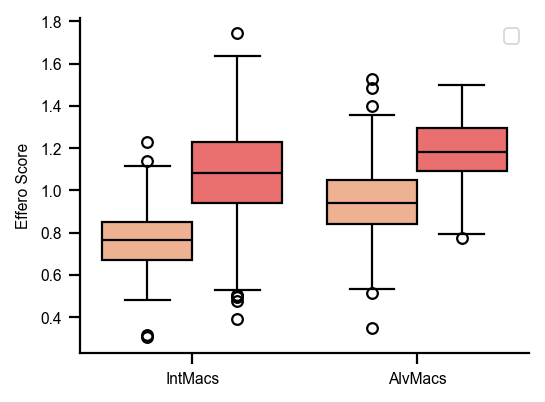

In [542]:
plt.figure(figsize=(3.6, 2.75))
sns.boxplot(macdata.obs, x='annot', y='effero_score', hue='Treatment',
            palette=['#fdad83', '#ff5a5a'], boxprops=dict(edgecolor='black'), medianprops=dict(color='black'), 
            whiskerprops=dict(color='black'), capprops=dict(color='black'), flierprops=dict(markeredgecolor='black'))
plt.grid(False)
sns.despine(top=True, right=True)
plt.legend("")
plt.grid(False)
plt.xlabel("", fontsize=7)
plt.ylabel("Effero Score", fontsize=7)
plt.xticks(fontsize=7)
plt.yticks(fontsize=7)
plt.savefig('fibrosis_figs/bleomycin_scores.pdf')

# Human fibrosis

In [311]:
adata = sc.read_h5ad("/mc_disk2/data/h5ads/phago/fibrosis_human.h5ad")

In [312]:
adata.obs.Disease = adata.obs.Disease.str.replace('DNO','NOR')

In [313]:
adata.obs.Site = adata.obs.Site.str.replace('R','')

In [314]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [315]:
sc.pp.filter_cells(adata, min_counts=500)

filtered out 13202286 cells that have less than 500 counts


In [316]:
adata = adata[adata.obs.pct_counts_mt < 10]

In [317]:
hb_genes = ['HBA1',
 'HBA2',
 'HBB',
 'HBD',
 'HBE1',
 'HBG1',
 'HBG2',
 'HBM',
 'HBQ1',
 'HBZ']

In [318]:
adata = adata[adata[:,hb_genes].X.sum(axis=1) <= 1]

In [319]:
adata.shape

(56113, 45068)

In [320]:
sc.pp.normalize_total(adata, target_sum=1e4)

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:01)


In [321]:
sc.pp.log1p(adata)

In [322]:
sc.pp.highly_variable_genes(adata)

extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [323]:
sc.pp.pca(adata, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50


    finished (0:00:07)


In [324]:
sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)


In [325]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:28)


In [326]:
sc.tl.leiden(adata, resolution=0.05)

running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:17)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


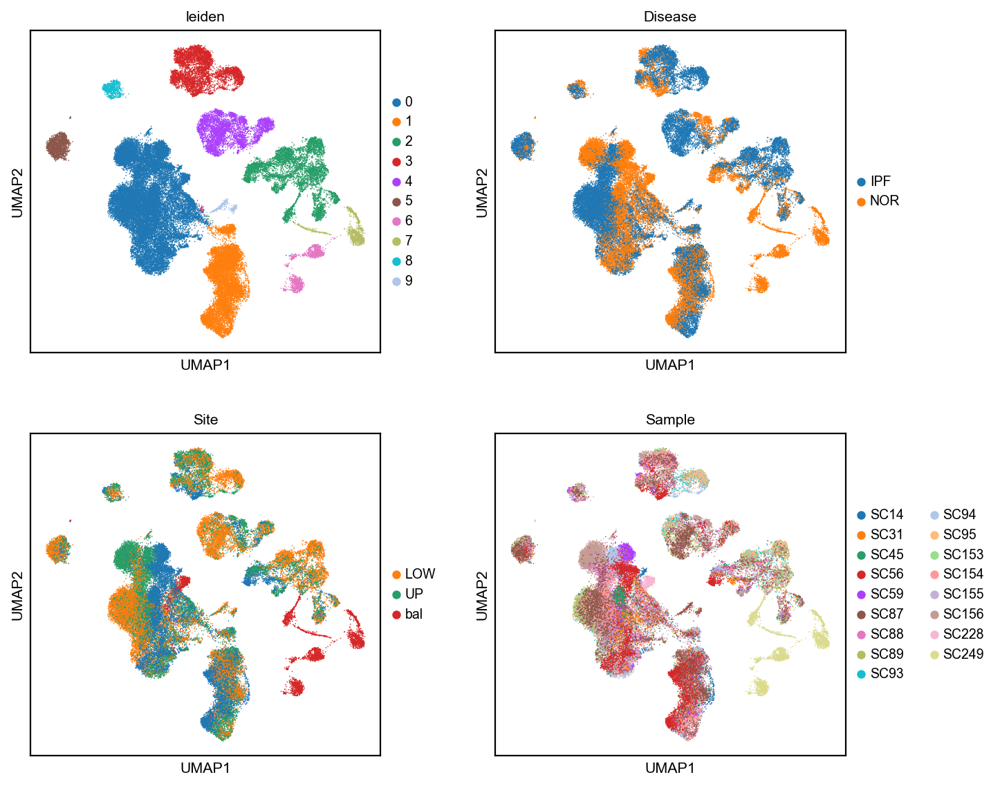

In [327]:
sc.pl.umap(adata, color=['leiden', 'Disease', 'Site', 'Sample'], ncols=2)

In [328]:
sc.tl.rank_genes_groups(adata, groupby="leiden")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


In [329]:
sc.tl.dendrogram(adata, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


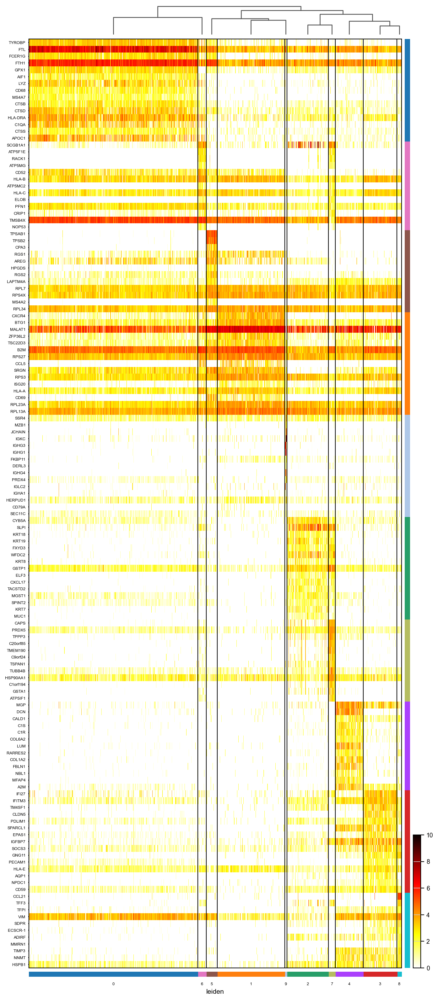

In [330]:
gene_dict = {str(i): [l[i] for l in adata.uns["rank_genes_groups"]["names"][:15]] 
             for i in adata.obs.leiden.values.categories}

prev_vals = []
for k in gene_dict.keys():
    gene_dict[k] = [i for i in gene_dict[k] if i not in prev_vals]
    prev_vals += gene_dict[k]

sc.pl.heatmap(adata, gene_dict, groupby="leiden", dendrogram=True, swap_axes=True, 
              cmap="hot_r", vmin=0, vmax=10, show_gene_labels=True)

In [331]:
annot_list = ['Macrophages', 'T cells', 'Epithelial cells', 'Endothelial cells', 'Fibroblasts', 'Mast cells', 
              'T cells', 'Epithelial cells', 'Endothelial cells', 'B cells']
adata.obs['annot'] = pd.Categorical([annot_list[int(i)] for i in adata.obs.leiden],
                                    categories=['Epithelial cells', 'Fibroblasts', 'Endothelial cells', 
                                                'T cells', 'B cells', 'Mast cells', 'Macrophages'])

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


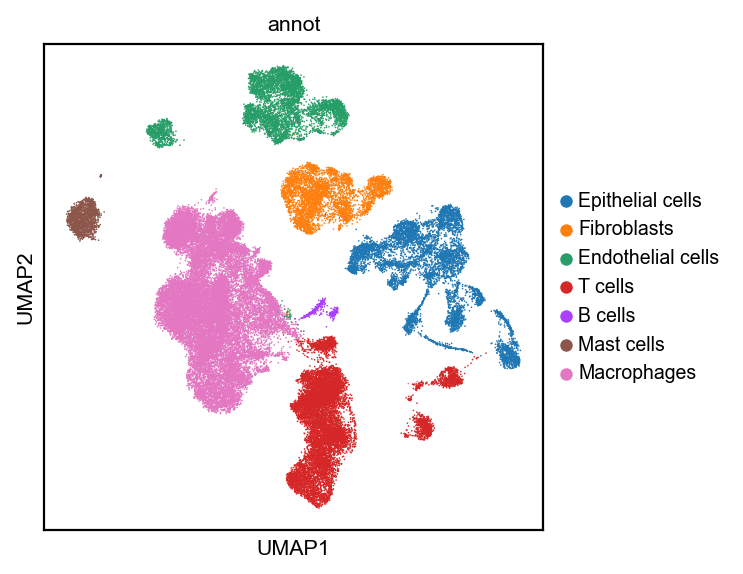

In [332]:
sc.pl.umap(adata, color='annot', save='_human_fibrosis.pdf')

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


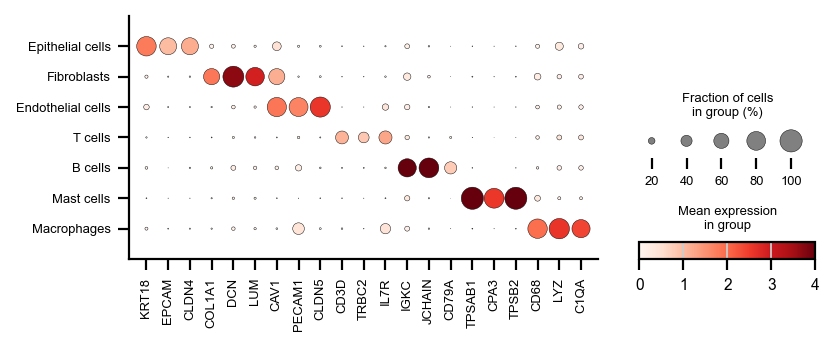

In [333]:
dot = sc.pl.dotplot(
    adata,
    ['KRT18', 'EPCAM', 'CLDN4',
     'COL1A1', 'DCN', 'LUM',
     'CAV1', 'PECAM1', 'CLDN5',
     'CD3D', 'TRBC2', 'IL7R', 
     'IGKC', 'JCHAIN', 'CD79A', 
     'TPSAB1', 'CPA3', 'TPSB2',
     'CD68', 'LYZ', 'C1QA'], 
    groupby='annot',
    figsize=(5.5, 2),
    vmax=4,
    return_fig=True
)

fig = dot.get_axes()['mainplot_ax'].get_figure()

# Hide top and right spines for all axes
for ax in fig.axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
# Shrink main dots
for artist in dot.get_axes()['mainplot_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)

# Shrink legend dots
for artist in dot.get_axes()['size_legend_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)
    
for label in ax.get_xticklabels():
    label.set_fontsize(7)
for label in ax.get_yticklabels():
    label.set_fontsize(7)

fig.savefig('fibrosis_figs/dotplothuman.pdf')

In [334]:
macdata = adata[adata.obs.annot == 'Macrophages']

In [335]:
sc.pp.highly_variable_genes(macdata)

extracting highly variable genes
    finished (0:00:01)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:553: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [37]:
sum(macdata.var.highly_variable)

3064

In [342]:
macdata.shape

(25447, 45068)

In [343]:
sc.pp.pca(macdata, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


In [344]:
sc.external.pp.bbknn(macdata, batch_key='Sample')

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)


In [345]:
sc.tl.leiden(macdata, resolution=0.1)

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:28)


In [346]:
sc.tl.umap(macdata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


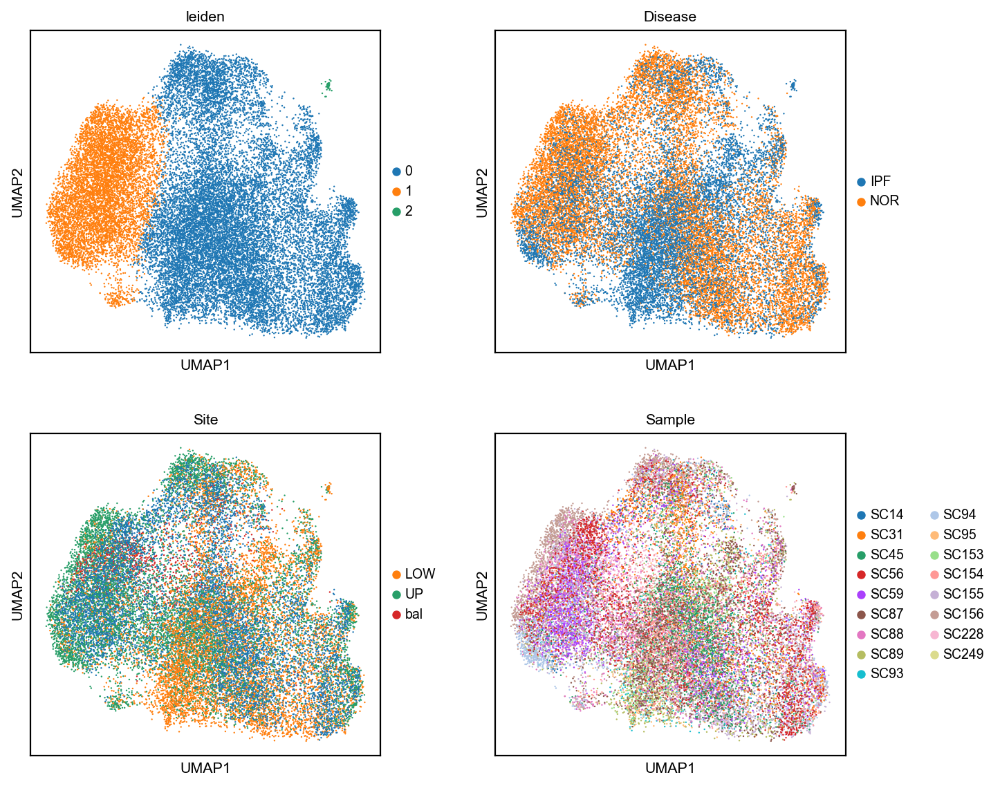

In [347]:
sc.pl.umap(macdata, color=['leiden', 'Disease', 'Site', 'Sample'], ncols=2)

In [348]:
sc.tl.rank_genes_groups(macdata, groupby="leiden")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


In [349]:
sc.tl.dendrogram(macdata, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


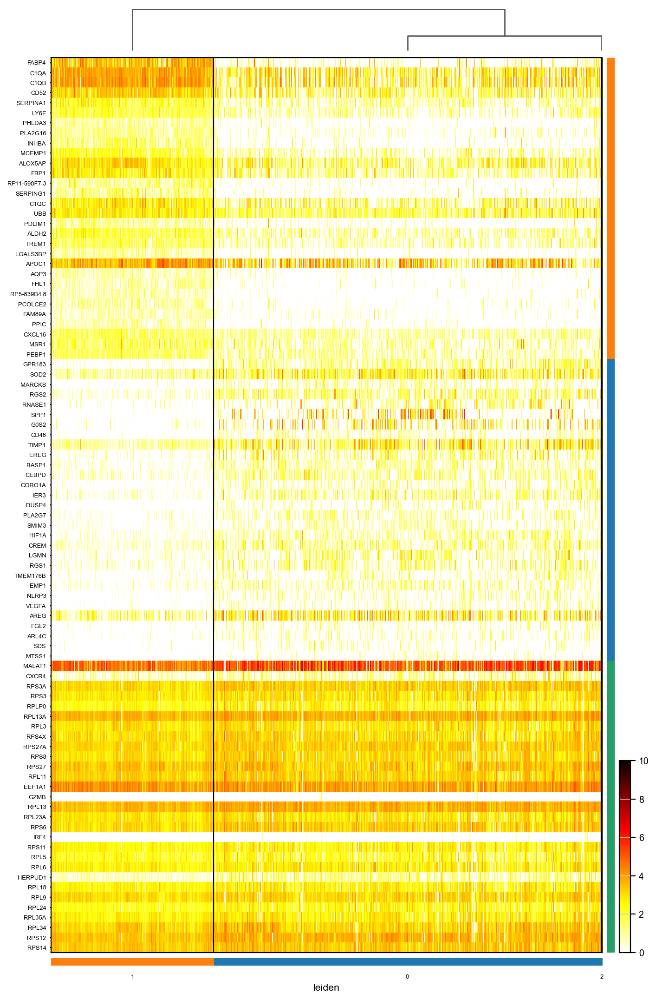

In [350]:
gene_dict = {str(i): [l[i] for l in macdata.uns["rank_genes_groups"]["names"][:30]] 
             for i in macdata.obs.leiden.values.categories}

prev_vals = []
for k in gene_dict.keys():
    gene_dict[k] = [i for i in gene_dict[k] if i not in prev_vals]
    prev_vals += gene_dict[k]

sc.pl.heatmap(macdata, gene_dict, groupby="leiden", dendrogram=True, swap_axes=True, 
              cmap="hot_r", vmin=0, vmax=10, show_gene_labels=True)

In [351]:
macdata = macdata[macdata.obs.leiden != "2"]

In [352]:
sc.tl.leiden(macdata, resolution=0.75)

running Leiden clustering


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/tools/_leiden.py:158: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added] = pd.Categorical(


    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:55)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


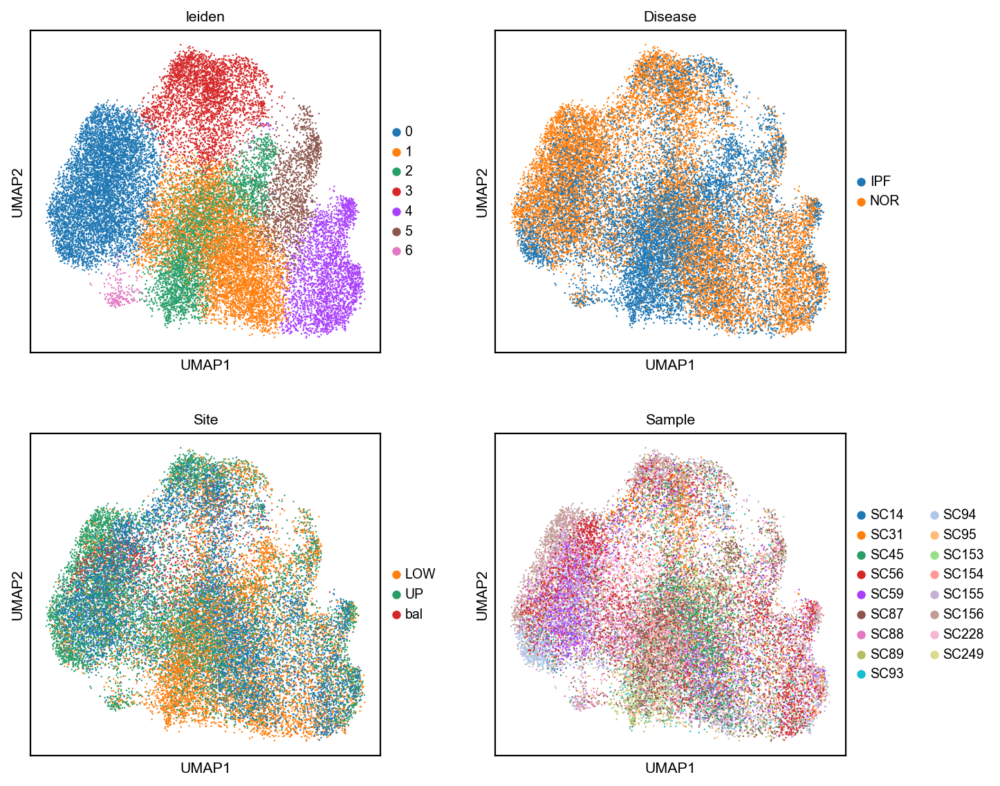

In [353]:
sc.pl.umap(macdata, color=['leiden', 'Disease', 'Site', 'Sample'], ncols=2)

In [354]:
sc.tl.rank_genes_groups(macdata, groupby="leiden")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


In [355]:
sc.tl.dendrogram(macdata, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


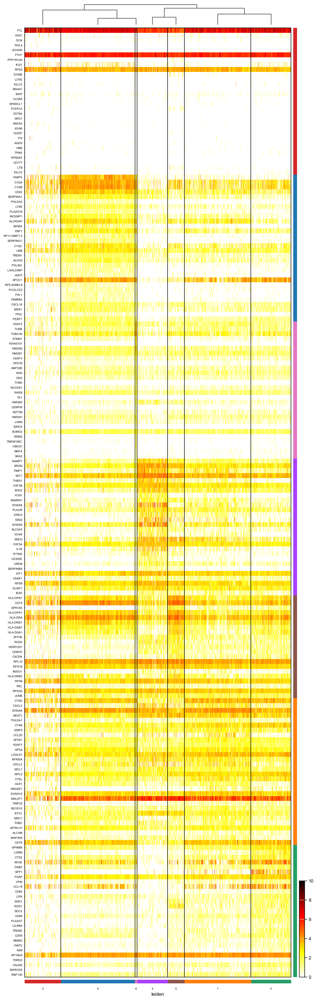

In [356]:
gene_dict = {str(i): [l[i] for l in macdata.uns["rank_genes_groups"]["names"][:30]] 
             for i in macdata.obs.leiden.values.categories}

prev_vals = []
for k in gene_dict.keys():
    gene_dict[k] = [i for i in gene_dict[k] if i not in prev_vals]
    prev_vals += gene_dict[k]

sc.pl.heatmap(macdata, gene_dict, groupby="leiden", dendrogram=True, swap_axes=True, 
              cmap="hot_r", vmin=0, vmax=10, show_gene_labels=True)

In [357]:
annot_list = ['AlvMacs', 'IntMacs', 'IntMacs', 'Doublets', 'Monocytes', 'Monocytes', 'AlvMacs']
annot_order = ['Monocytes', 'IntMacs', 'AlvMacs', 'Doublets']
macdata.obs['annot'] = pd.Categorical([annot_list[int(i)] for i in macdata.obs.leiden], categories=annot_order, ordered=True)

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


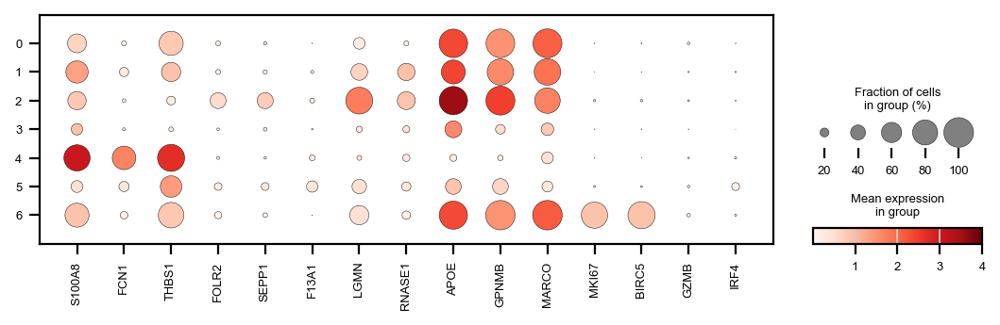

In [358]:
sc.pl.dotplot(
    macdata,
    ['S100A8', 'FCN1', 'THBS1', 
     'FOLR2', 'SEPP1', 'F13A1',
     'LGMN', 'RNASE1',
     'APOE', 'GPNMB', 'MARCO',
     'MKI67', 'BIRC5', 
     'GZMB', 'IRF4'], 
    groupby='leiden',
    figsize=(8, 2),
    vmax=4)

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


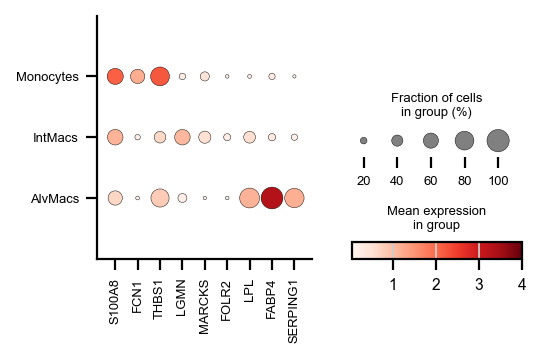

In [359]:
dot = sc.pl.dotplot(
    macdata[macdata.obs.annot != "Doublets"],
    ['S100A8', 'FCN1', 'THBS1', 
     'LGMN', 'MARCKS', 'FOLR2', 
     'LPL', 'FABP4', 'SERPING1'], 
    groupby='annot',
    figsize=(3.4, 2),
    vmax=4,
    return_fig=True
)

fig = dot.get_axes()['mainplot_ax'].get_figure()

# Hide top and right spines for all axes
for ax in fig.axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
# Shrink main dots
for artist in dot.get_axes()['mainplot_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)

# Shrink legend dots
for artist in dot.get_axes()['size_legend_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)
    
for label in ax.get_xticklabels():
    label.set_fontsize(7)
for label in ax.get_yticklabels():
    label.set_fontsize(7)

fig.savefig('fibrosis_figs/dotplothuman_macs.pdf')

In [370]:
sc.tl.score_genes(macdata, new_up_and_corr_genes_human, score_name='effero_score', use_raw=False)

computing score 'effero_score'


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(


    finished: added
    'effero_score', score of gene set (adata.obs).
    348 total control genes are used. (0:00:27)


In [371]:
over_min_df = pd.DataFrame(macdata.obs[['annot', 'Sample']].value_counts(sort=False) > 10).reset_index()

In [372]:
over_min_df = over_min_df[over_min_df['count'] == True]

In [373]:
mask = macdata.obs.set_index(['annot', 'Sample']).index.isin(
    over_min_df.set_index(['annot', 'Sample']).index
)

In [374]:
mask.all()

True

In [375]:
macdata_full = macdata.copy()

In [376]:
macdata = macdata[mask]

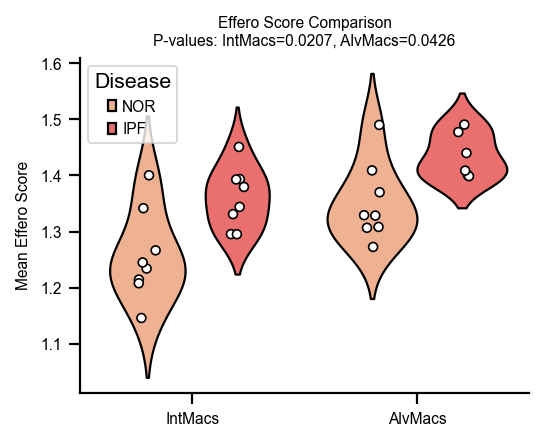

In [ ]:
mean_scores_list = []

for annot in ["IntMacs", "AlvMacs"]:
    mean_scores = macdata[macdata.obs.annot == annot].obs.groupby(["Sample", "Disease"])['effero_score'].mean().reset_index()
    mean_scores = mean_scores.dropna()
    mean_scores["Disease"] = pd.Categorical(mean_scores["Disease"], categories=["NOR", "ALS"], ordered=True)
    mean_scores["Annot"] = annot  # Add annotation column for plotting
    
    nor_scores = mean_scores.loc[mean_scores["Disease"] == "NOR", "effero_score"]
    ipf_scores = mean_scores.loc[mean_scores["Disease"] == "IPF", "effero_score"]
    stat, p_value = mannwhitneyu(nor_scores, ipf_scores, alternative="two-sided")
    mean_scores["P_value"] = p_value  # Store p-value for reference
    
    mean_scores_list.append(mean_scores)

# Combine data for unified plotting
combined_scores = pd.concat(mean_scores_list)

plt.figure(figsize=(3.6, 2.75))
sns.violinplot(
    data=combined_scores,
    inner=None,
    x="Annot",
    y="effero_score",
    hue="Disease",
    edgecolor="black",
    palette=['#fdad83', '#ff5a5a']
)
sns.stripplot(
    data=combined_scores,
    x="Annot",
    y="effero_score",
    hue="Disease",
    dodge=True,
    size=4,
    edgecolor="black",
    palette=["white", "white"],
    linewidth=0.75,
    legend=False
)
plt.title("Effero Score Comparison\nP-values: IntMacs={:.4f}, AlvMacs={:.4f}".format(
    mean_scores_list[0]["P_value"].iloc[0], mean_scores_list[1]["P_value"].iloc[0]
), fontsize=7)
plt.legend(title="Disease", fontsize=7)
sns.despine(top=True, right=True)
plt.xlabel("", fontsize=7)
plt.ylabel("Mean Effero Score", fontsize=7)
plt.xticks(fontsize=7)
plt.yticks(fontsize=7)
plt.grid(False)
plt.savefig('fibrosis_figs/combined_scores_human.pdf')
plt.show()

In [379]:
macdata.write_h5ad("/mc_disk2/data/h5ads/phago/human_fibrosis_macrophages.h5ad")

In [412]:
intmacs = macdata[(macdata.obs.annot == "IntMacs")]

In [413]:
intmacs

View of AnnData object with n_obs × n_vars = 10162 × 45068
    obs: 'Sample', 'Disease', 'Site', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'annot', 'effero_score'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Disease_colors', 'Site_colors', 'Sample_colors', 'rank_genes_groups', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [426]:
sc.pp.filter_genes(intmacs, min_cells=10)

filtered out 28941 genes that are detected in less than 10 cells


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [427]:
nor_intmacs = intmacs[intmacs.obs.Disease == "NOR"].copy()
ipf_intmacs = intmacs[intmacs.obs.Disease == "IPF"].copy()

In [428]:
gene_df = pd.DataFrame(index=intmacs.var_names, columns=['pearson_r_normal', 'pearson_p_normal', 'pearson_r_ipf', 'pearson_p_ipf'])

In [431]:
for gene in intmacs.var_names:
    r_nor, p_nor = pearsonr(nor_intmacs[:, gene].X.todense().A1, nor_intmacs.obs['effero_score'])
    r_ipf, p_ipf = pearsonr(ipf_intmacs[:, gene].X.todense().A1, ipf_intmacs.obs['effero_score'])
    
    gene_df.loc[gene, 'pearson_r_normal'] = r_nor
    gene_df.loc[gene, 'pearson_p_normal'] = p_nor
    gene_df.loc[gene, 'pearson_r_ipf'] = r_ipf
    gene_df.loc[gene, 'pearson_p_ipf'] = p_ipf

/home/orimosko/.local/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


In [440]:
gene_df = gene_df.loc[np.setdiff1d(gene_df.index, new_up_and_corr_genes_human)]

In [450]:
gene_df_intmacs_both = gene_df.copy()

In [ ]:
gene_df.to_csv('correlations_IPF_both.csv')

# Mouse BC

In [543]:
adata = sc.read_h5ad("/mc_disk2/data/h5ads/breast/full_kinetics.h5ad")

In [545]:
cell_to_mc = pd.read_csv('/home/orimosko/projects/updated_breast/annotations/cell_to_metacell_annot.csv', index_col=0)

In [546]:
cell_to_mc.metacell = cell_to_mc.metacell.astype(str)

In [554]:
adata = adata[adata.obs_names.isin(cell_to_mc.index)].copy()

In [555]:
adata.shape

(39782, 37508)

In [556]:
adata.obs['metacell'] = cell_to_mc.loc[adata.obs_names, 'metacell'].values

In [568]:
cell_to_mc

,metacell,annots
AB529_E21,692,Ductal macs
AB529_L9,700,Ductal macs
AB529_B12,701,Ductal macs
AB529_A9,679,Ductal macs
AB529_D5,259,doublets
...,...,...
AB341_P9,546,T cells
AB341_B14,525,B cells
AB341_B12,546,T cells
AB341_A8,287,Tumor cells


In [578]:
mc_to_annot = cell_to_mc.set_index('metacell')
mc_to_annot = mc_to_annot[~mc_to_annot.index.duplicated(keep='first')]

In [580]:
adata.obs['annot'] = mc_to_annot.loc[adata.obs.metacell.values, 'annots'].values

In [581]:
adata = adata[adata.obs.annot.isin(['Ductal macs', 'Perivasc macs']) & adata.obs.Age.isin(['6w', '8w', '10w', '12w'])]

In [582]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [583]:
sc.pp.log1p(adata)

In [599]:
sc.tl.score_genes(adata, new_up_and_corr_genes, score_name='effero_score')

computing score 'effero_score'
    finished: added
    'effero_score', score of gene set (adata.obs).
    499 total control genes are used. (0:00:00)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(


In [600]:
over_min_df = pd.DataFrame(adata.obs[['annot', 'Batch.Set.ID', 'condition']].value_counts(sort=False) > 10).reset_index()

In [601]:
over_min_df = over_min_df[over_min_df['count'] == True]

In [602]:
mask = adata.obs.set_index(['annot', 'Batch.Set.ID', 'condition']).index.isin(
    over_min_df.set_index(['annot', 'Batch.Set.ID', 'condition']).index
)

In [603]:
adata_full = adata.copy()

In [604]:
adata = adata[mask]

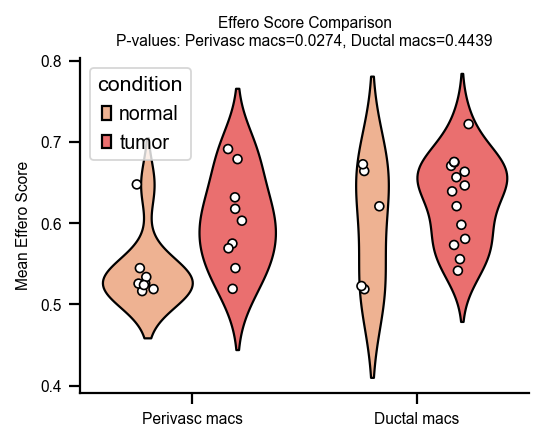

In [605]:
mean_scores_list = []

for annot in ["Perivasc macs", "Ductal macs"]:
    mean_scores = adata[adata.obs.annot == annot].obs.groupby(["Batch.Set.ID", "condition"])['effero_score'].mean().reset_index()
    mean_scores = mean_scores.dropna()
    mean_scores["condition"] = pd.Categorical(mean_scores["condition"], categories=["normal", "tumor"], ordered=True)
    mean_scores["Annot"] = annot  # Add annotation column for plotting
    
    nor_scores = mean_scores.loc[mean_scores["condition"] == "normal", "effero_score"]
    tumor_scores = mean_scores.loc[mean_scores["condition"] == "tumor", "effero_score"]
    stat, p_value = mannwhitneyu(nor_scores, tumor_scores, alternative="two-sided")
    mean_scores["P_value"] = p_value  # Store p-value for reference
    
    mean_scores_list.append(mean_scores)

# Combine data for unified plotting
combined_scores = pd.concat(mean_scores_list)

plt.figure(figsize=(3.6, 2.75))
sns.violinplot(
    data=combined_scores,
    inner=None,
    x="Annot",
    y="effero_score",
    hue="condition",
    edgecolor="black",
    palette=['#fdad83', '#ff5a5a']
)
sns.stripplot(
    data=combined_scores,
    x="Annot",
    y="effero_score",
    hue="condition",
    dodge=True,
    size=4,
    edgecolor="black",
    palette=["white",'white'],
    linewidth=0.75,
    legend=False
)
plt.title("Effero Score Comparison\nP-values: Perivasc macs={:.4f}, Ductal macs={:.4f}".format(
    mean_scores_list[0]["P_value"].iloc[0], mean_scores_list[1]["P_value"].iloc[0]
), fontsize=7)
sns.despine(top=True, right=True)
plt.xlabel("", fontsize=7)
plt.ylabel("Mean Effero Score", fontsize=7)
plt.xticks(fontsize=7)
plt.yticks(fontsize=7)
plt.grid(False)

plt.legend(title="condition")
plt.grid(False)
plt.savefig('breast_figs/combined_scores.pdf')
plt.show()

# Human NSCLC

In [116]:
adata = sc.read_h5ad("/mc_disk2/data/h5ads/downloaded_lung/miriam_merged_QC.h5ad")

In [117]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:01)


In [118]:
sc.pp.log1p(adata)

In [119]:
sc.pp.highly_variable_genes(adata)

extracting highly variable genes
    finished (0:00:09)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [120]:
sc.pp.pca(adata, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:20)


In [121]:
sc.external.pp.bbknn(adata, batch_key='patient_ID')

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:04:27)


In [122]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:07:44)


In [123]:
sc.tl.leiden(adata, resolution=0.1)

running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:23:41)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


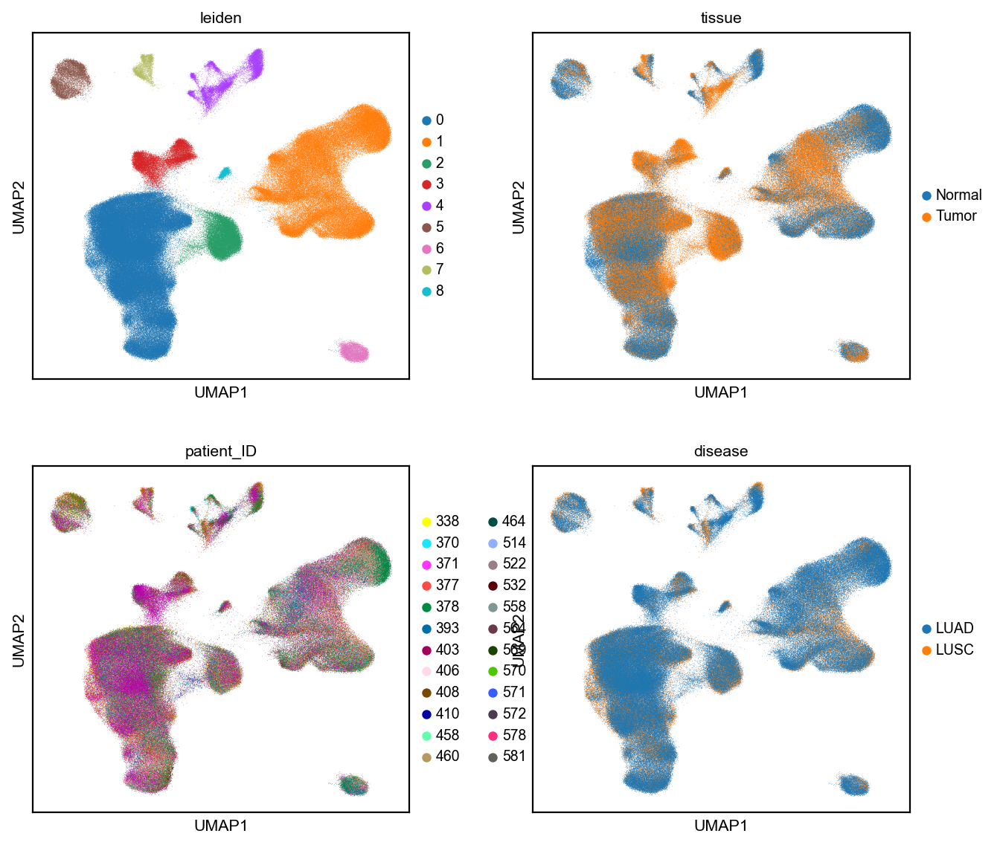

In [124]:
sc.pl.umap(adata, color=['leiden', 'tissue', 'patient_ID', 'disease'], ncols=2)

In [125]:
sc.tl.rank_genes_groups(adata, groupby="leiden")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:20)


In [126]:
sc.tl.dendrogram(adata, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


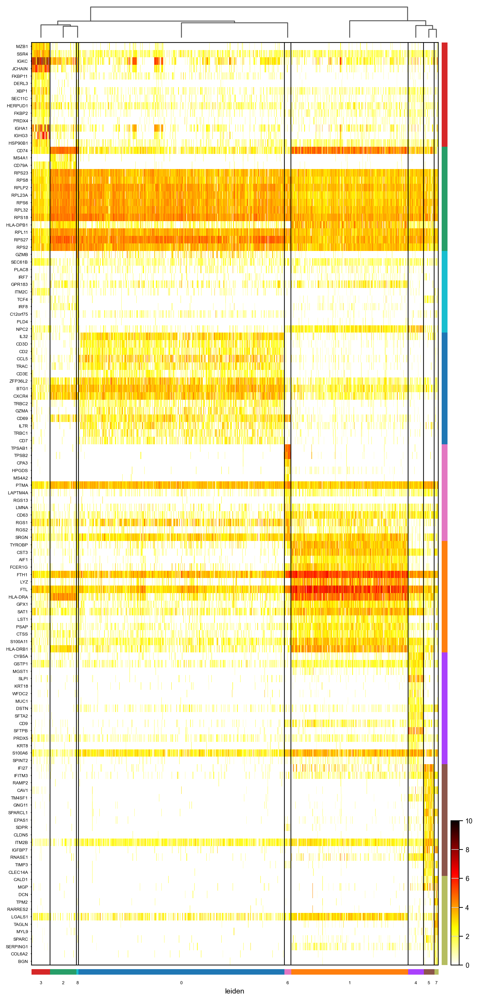

In [127]:
gene_dict = {str(i): [l[i] for l in adata.uns["rank_genes_groups"]["names"][:15]] 
             for i in adata.obs.leiden.values.categories}

prev_vals = []
for k in gene_dict.keys():
    gene_dict[k] = [i for i in gene_dict[k] if i not in prev_vals]
    prev_vals += gene_dict[k]

sc.pl.heatmap(adata, gene_dict, groupby="leiden", dendrogram=True, swap_axes=True, 
              cmap="hot_r", vmin=0, vmax=10, show_gene_labels=True)

In [128]:
annot_list = ['T cells', 'Macrophages', 'B cells', 'Plasma cells', 'Epithelial cells', 'Endothelial cells', 'Mast cells', 
              'Fibroblasts', 'pDC']
adata.obs['annot'] = pd.Categorical([annot_list[int(i)] for i in adata.obs.leiden],
                                    categories=['Epithelial cells', 'Fibroblasts', 'Endothelial cells', 
                                                'T cells', 'B cells', 'Plasma cells', 'pDC', 'Mast cells', 'Macrophages'])

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


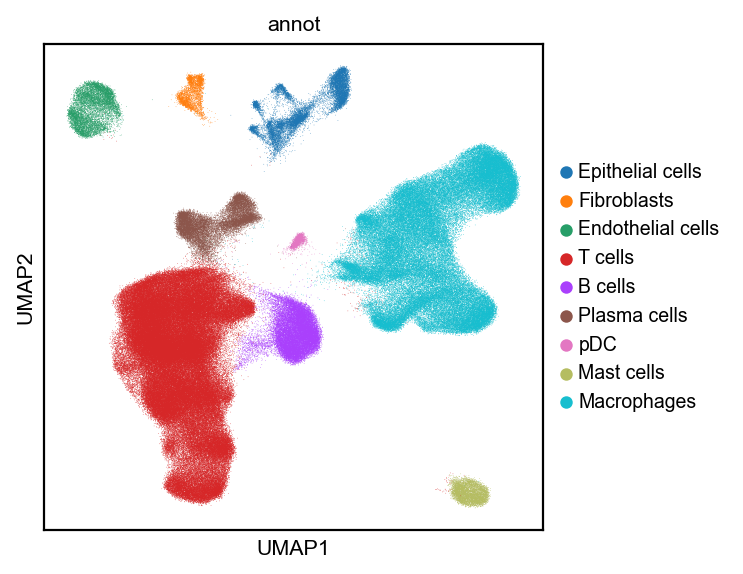

In [131]:
sc.pl.umap(adata, color='annot', save='_human_nsclc.pdf')

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


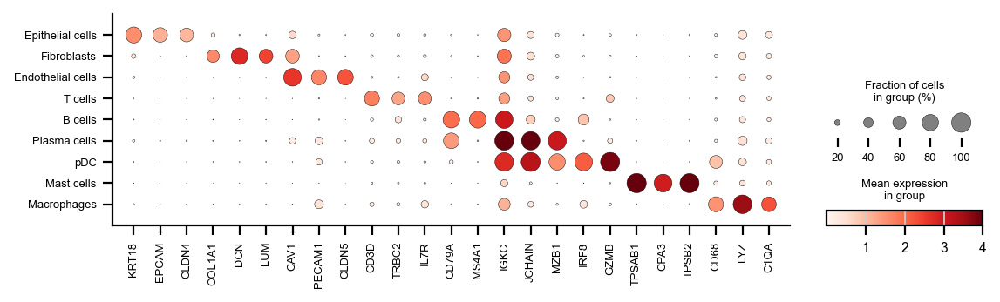

In [132]:
dot = sc.pl.dotplot(
    adata,
    ['KRT18', 'EPCAM', 'CLDN4',
     'COL1A1', 'DCN', 'LUM',
     'CAV1', 'PECAM1', 'CLDN5',
     'CD3D', 'TRBC2', 'IL7R', 
     'CD79A', 'MS4A1',
     'IGKC', 'JCHAIN', 'MZB1', 
     'IRF8', 'GZMB', 
     'TPSAB1', 'CPA3', 'TPSB2',
     'CD68', 'LYZ', 'C1QA'], 
    groupby='annot',
    figsize=(8, 2),
    vmax=4,
    return_fig=True
)

fig = dot.get_axes()['mainplot_ax'].get_figure()

# Hide top and right spines for all axes
for ax in fig.axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
# Shrink main dots
for artist in dot.get_axes()['mainplot_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)

# Shrink legend dots
for artist in dot.get_axes()['size_legend_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)
    
for label in ax.get_xticklabels():
    label.set_fontsize(7)
for label in ax.get_yticklabels():
    label.set_fontsize(7)

fig.savefig('NSCLC_figs/dotplothuman.pdf')

In [145]:
adata.write_h5ad("/mc_disk2/data/h5ads/downloaded_lung/miriam_merged_annotated.h5ad")

In [133]:
macdata = adata[adata.obs.annot == 'Macrophages']

In [134]:
sc.pp.highly_variable_genes(macdata)

extracting highly variable genes
    finished (0:00:05)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:553: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [135]:
sc.pp.pca(macdata, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:09)


In [136]:
sc.external.pp.bbknn(macdata, batch_key='patient_ID')

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:13)


In [137]:
sc.tl.umap(macdata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:47)


In [138]:
sc.tl.leiden(macdata, resolution=1)

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:07:21)


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


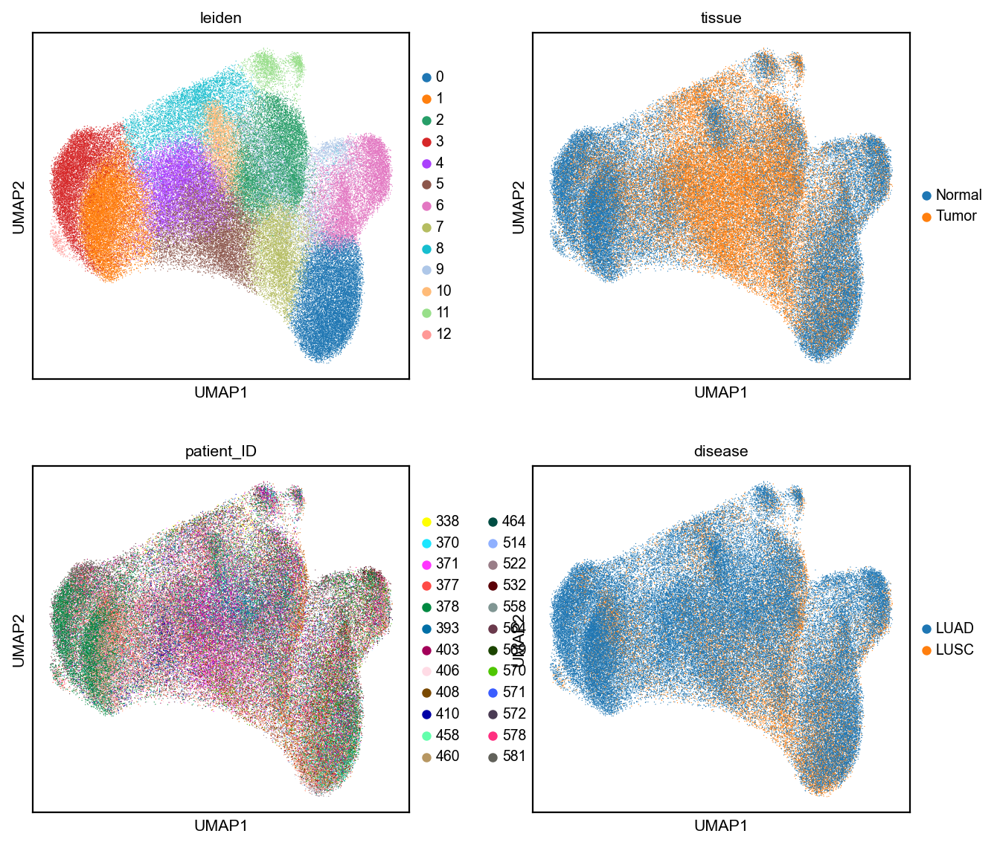

In [139]:
sc.pl.umap(macdata, color=['leiden', 'tissue', 'patient_ID', 'disease'], ncols=2)

In [140]:
sc.tl.rank_genes_groups(macdata, groupby="leiden")

ranking genes


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:24)


In [141]:
sc.tl.dendrogram(macdata, groupby='leiden')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


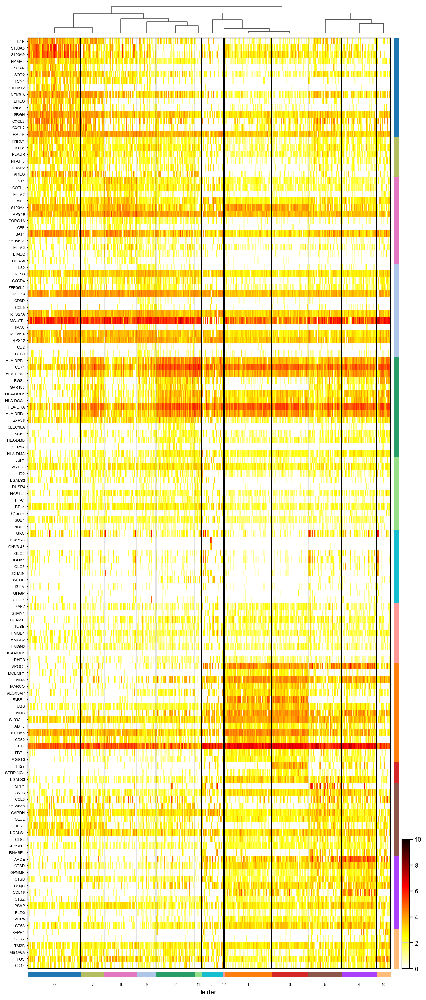

In [142]:
gene_dict = {str(i): [l[i] for l in macdata.uns["rank_genes_groups"]["names"][:15]] 
             for i in macdata.obs.leiden.values.categories}

prev_vals = []
for k in gene_dict.keys():
    gene_dict[k] = [i for i in gene_dict[k] if i not in prev_vals]
    prev_vals += gene_dict[k]

sc.pl.heatmap(macdata, gene_dict, groupby="leiden", dendrogram=True, swap_axes=True, 
              cmap="hot_r", vmin=0, vmax=10, show_gene_labels=True)

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


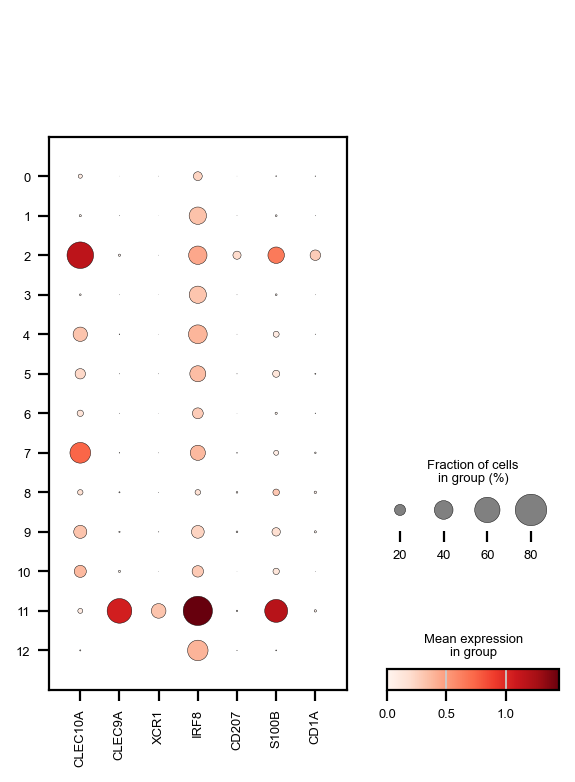

In [143]:
sc.pl.dotplot(macdata, ["CLEC10A", "CLEC9A", "XCR1", "IRF8", "CD207", "S100B", "CD1A"], groupby='leiden')

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


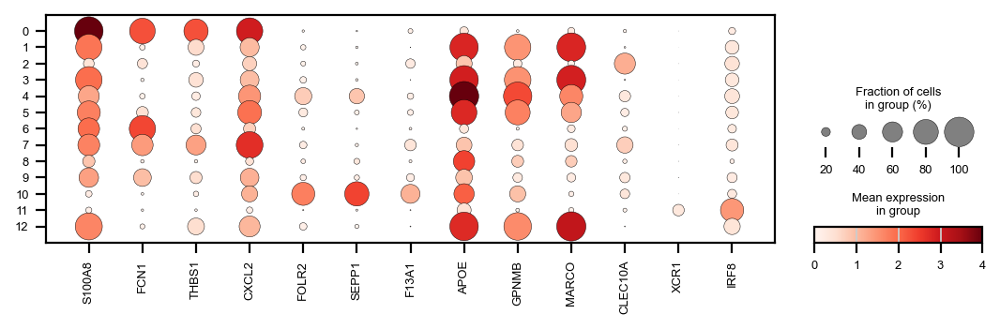

In [148]:
sc.pl.dotplot(
    macdata,
    ['S100A8', 'FCN1', 'THBS1', 'CXCL2',
     'FOLR2', 'SEPP1', 'F13A1',
     'APOE', 'GPNMB', 'MARCO',
     'CLEC10A', 'XCR1', 'IRF8'], 
    groupby='leiden',
    figsize=(8, 2),
    vmax=4)

In [149]:
annot_list = ['Monocytes', 'AlvMacs', 
              'cDC2', 
              'AlvMacs', 
              'AlvMacs', 
              'AlvMacs', 
              'Monocytes', 
              'MonMacs', 
              'Doublets', 
              'Doublets',
              'IntMacs', 
              'cDC1', 
              'AlvMacs']
macdata.obs['annot'] = pd.Categorical([annot_list[int(i)] for i in macdata.obs.leiden],
                                    categories=['Monocytes', 'MonMacs', 'cDC1', 'cDC2', 'IntMacs', 'AlvMacs'])

/home/orimosko/.local/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


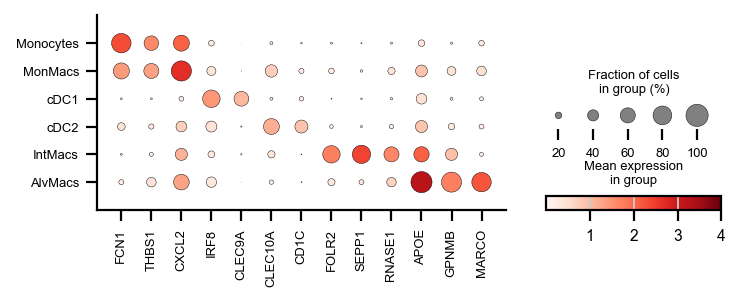

In [150]:
dot = sc.pl.dotplot(
    macdata[macdata.obs.annot != "Doublets"],
    ['FCN1', 'THBS1', 'CXCL2', 
     'IRF8', 'CLEC9A',
     'CLEC10A', 'CD1C',
     'FOLR2', 'SEPP1', 'RNASE1',
     'APOE', 'GPNMB', 'MARCO'], 
    groupby='annot',
    figsize=(5, 1.6),
    vmax=4,
    return_fig=True
)

fig = dot.get_axes()['mainplot_ax'].get_figure()

# Hide top and right spines for all axes
for ax in fig.axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
# Shrink main dots
for artist in dot.get_axes()['mainplot_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)

# Shrink legend dots
for artist in dot.get_axes()['size_legend_ax'].collections:
    artist.set_sizes(artist.get_sizes() * 0.5)
    
for label in ax.get_xticklabels():
    label.set_fontsize(7)
for label in ax.get_yticklabels():
    label.set_fontsize(7)

fig.savefig('NSCLC_figs/dotplothuman_macrophages.pdf')

In [151]:
sc.tl.score_genes(macdata, new_up_and_corr_genes_human, score_name='effero_score', use_raw=False)

computing score 'effero_score'
    finished: added
    'effero_score', score of gene set (adata.obs).
    453 total control genes are used. (0:00:01)


In [152]:
macdata

AnnData object with n_obs × n_vars = 97344 × 25661
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample_ID', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'HTO_num', 'patient_ID', 'amp_batch_ID', 'old_lib_name', 'HTO', 'tissue', 'disease', 'Species', 'library_chemistry', 'prime', 'vdj_kit', 'prep', 'path', 'ident', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'count_scale', 'n_counts', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden', 'annot', 'effero_score'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'X_name', 'scrublet', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'tissue_colors', 'patient_ID_colors', 'disease_colors', 'rank_genes_groups', 'dendrogram_leiden', 'annot_colors'
    obsm: 'X_pca', 'X_u

In [153]:
box_df = macdata[macdata.obs.annot.isin(['IntMacs', 'AlvMacs'])].obs[['patient_ID','effero_score', 'tissue', 'annot']]

over_min_df = pd.DataFrame(box_df[['patient_ID', 'tissue', 'annot']].value_counts(sort=False) > 10).reset_index()

over_min_df = over_min_df[over_min_df['count'] == True]

count_df = over_min_df[['patient_ID', 'annot']].value_counts(sort=False).reset_index()

In [154]:
count_df = count_df[count_df['count'] == 2]

In [155]:
mask = box_df.set_index(['patient_ID', 'annot']).index.isin(
    count_df.set_index(['patient_ID', 'annot']).index
)


In [156]:
box_df = box_df[mask]

IntMacs
Wilcoxon test: statistic=1.000, p-value=3.052e-05
AlvMacs
Wilcoxon test: statistic=19.000, p-value=1.830e-05


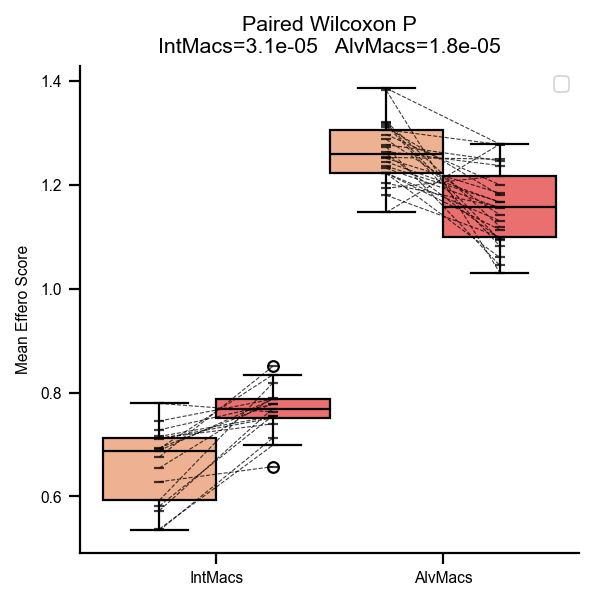

In [158]:
# Plot all lines in the same color
sns.boxplot(mean_scores, x='annot', y='effero_score', hue='tissue', width=1, palette=['#fdad83', '#ff5a5a'],
            boxprops=dict(edgecolor='black'), medianprops=dict(color='black'), 
            whiskerprops=dict(color='black'), capprops=dict(color='black'), flierprops=dict(markeredgecolor='black'))

p_vals = []

for i in range(2):
    mac = ['IntMacs', 'AlvMacs'][i]
    mac_mean_scores = mean_scores[mean_scores.annot == mac]
    
    paired_data = mac_mean_scores.pivot(index=["patient_ID", "annot"], columns="tissue", values="effero_score").dropna()
    stat, p_value = wilcoxon(paired_data.iloc[:, 0], paired_data.iloc[:, 1])
    p_vals.append(p_value)
    print(mac)
    print(f"Wilcoxon test: statistic={stat:.3f}, p-value={p_value:.3e}")

    for patient in mac_mean_scores["patient_ID"].unique():
        subset = mac_mean_scores[mac_mean_scores["patient_ID"] == patient]
        plt.plot([i-0.25, i+0.25], subset["effero_score"], marker="_", color="black", alpha=0.75, 
                 linewidth=0.5, linestyle='dashed')
        
        
            
plt.grid(False)
sns.despine(top=True, right=True)
plt.legend("")
plt.grid(False)
plt.xlabel("", fontsize=7)
plt.ylabel("Mean Effero Score", fontsize=7)
plt.xticks(fontsize=7)
plt.yticks(fontsize=7)

plt.title(f"Paired Wilcoxon P\nIntMacs={p_vals[0]:.2}   AlvMacs={p_vals[1]:.2}")
plt.savefig('NSCLC_figs/miriam_bothmacs_scores.pdf')

In [159]:
macdata.write_h5ad("/mc_disk2/data/h5ads/downloaded_lung/miriam_merged_macrophages.h5ad")

In [635]:
macdata = sc.read_h5ad("/mc_disk2/data/h5ads/downloaded_lung/miriam_merged_macrophages.h5ad")

In [636]:
macdata_nsclc=macdata.copy()

In [637]:
macdata_nsclc.obs['tissue'].value_counts()

tissue
Normal    54172
Tumor     43172
Name: count, dtype: int64

In [639]:
intmacs = macdata_nsclc[macdata_nsclc.obs.annot == "IntMacs"].copy()

In [641]:
intmacs.obs.tissue.value_counts()

tissue
Normal    1950
Tumor     1897
Name: count, dtype: int64

In [ ]:
macdata_nsclc = macdata_nsclc[macdata_nsclc.obs.tissue == "Tumor"]

In [170]:
macdata_nsclc.obs.annot.value_counts()

annot
AlvMacs      16434
cDC2          7007
Monocytes     5731
MonMacs       4522
IntMacs       1897
cDC1           854
Name: count, dtype: int64

In [642]:
intmacs = macdata_nsclc[macdata_nsclc.obs.annot == "IntMacs"]

In [237]:
sc.tl.score_genes(intmacs, gene_list=new_up_and_corr_genes_human, score_name="effero_score", use_raw=False)

computing score 'effero_score'


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[score_name] = pd.Series(


    finished: added
    'effero_score', score of gene set (adata.obs).
    553 total control genes are used. (0:00:01)


In [643]:
sc.pp.filter_genes(intmacs, min_cells=10)

filtered out 12199 genes that are detected in less than 10 cells


/home/orimosko/.local/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [644]:
nor_intmacs = intmacs[intmacs.obs.tissue == "Normal"].copy()
ipf_intmacs = intmacs[intmacs.obs.tissue == "Tumor"].copy()

In [645]:
gene_df = pd.DataFrame(index=intmacs.var_names, columns=['pearson_r_normal', 'pearson_p_normal', 'pearson_r_ipf', 'pearson_p_ipf'])

In [648]:
for gene in intmacs.var_names:
    r_nor, p_nor = pearsonr(nor_intmacs[:, gene].X.todense().A1, nor_intmacs.obs['effero_score'])
    r_ipf, p_ipf = pearsonr(ipf_intmacs[:, gene].X.todense().A1, ipf_intmacs.obs['effero_score'])
    
    gene_df.loc[gene, 'pearson_r_normal'] = r_nor
    gene_df.loc[gene, 'pearson_p_normal'] = p_nor
    gene_df.loc[gene, 'pearson_r_ipf'] = r_ipf
    gene_df.loc[gene, 'pearson_p_ipf'] = p_ipf

/home/orimosko/.local/lib/python3.8/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


In [650]:
gene_df = gene_df.loc[np.setdiff1d(gene_df.index, new_up_and_corr_genes_human)]

In [653]:
gene_df.to_csv('intmacs_nsclc_both.csv')